<a href="https://colab.research.google.com/github/cr7great/ML-work-Ginger-lab-UW/blob/main/The_Im2Spec_Reloaded_revised_for_NRs_orientation_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The Im2Spec Reloaded - revised for NRs orientation prediction

*Prepared by Mengqi "Will' Sun (Feb. 2025)*

*With intellectual contribution from Zixu Huang, Aditya Raghavan, and Muammer Yaman*

This notebook demonstrates a revised version of im2spec model (originally wrote by Maxim Ziatidnov) where one trains jointly image-to-image and spec-to-spec variational autoencoders (VAEs) while trying to 'align' their respective latent spaces. The latent space 'alignment' is done by learning a linear transformation map between the two latent spaces during the model training. Here we adopt the roational-invariance during image training and disregard the coordinate transformation step to preserve the rotational information of image object. The datasets contain correlated linearly polarized scattering spectra of gold nanorods and scanning electron microscope images.

Imports:

In [1]:
from typing import Union, Tuple, List, Type, Optional

import math
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision

import os

Load the NN building blocks and necessary utility functions (just 'run' the cell below - you don't need to open the code inside it unless you want to introduce some changes)

👇👇👇

In [2]:
#@title 🧠🛠️ { form-width: "20%" }

from warnings import warn, filterwarnings
filterwarnings("ignore", module="torch.nn.functional")
tt = torch.tensor

########################### Convolutional neural nets #########################

class convEncoderNet(nn.Module):
    """
    Standard convolutional encoder
    """
    def __init__(self,
                 input_dim: Tuple[int],
                 input_channels: int = 1,
                 latent_dim: int = 2,
                 hidden_dim: List[Tuple[int]] = None,
                 batchnorm: bool = True,
                 activation: str = "lrelu",
                 pool: bool = True,
                 ) -> None:
        """
        Initializes encoder module
        """
        super(convEncoderNet, self).__init__()
        if hidden_dim is None:
            hidden_dim = [(32,), (64, 64), (96, 96)]
        output_dim = [dim // 2**len(hidden_dim) for dim in input_dim]
        output_channels = hidden_dim[-1][-1]
        self.latent_dim = latent_dim
        self.feature_extractor = FeatureExtractor(
            len(input_dim), input_channels, hidden_dim,
            batchnorm, activation, pool)
        self.features2latent = features_to_latent(
            [output_channels, *output_dim], 2*latent_dim)

    def forward(self, x: torch.Tensor) -> Tuple[torch.Tensor]:
        """
        Forward pass
        """
        x = self.feature_extractor(x)
        encoded = self.features2latent(x)
        mu, log_sig = encoded.split(self.latent_dim, 1)
        return mu, log_sig


class convDecoderNet(nn.Module):
    """
    Standard convolutional decoder
    """
    def __init__(self,
                 latent_dim: int,
                 output_dim: int,
                 output_channels: int = 1,
                 hidden_dim: List[Tuple[int]] = None,
                 batchnorm: bool = True,
                 activation: str = "lrelu",
                 sigmoid_out: bool = True,
                 upsampling_mode: str = "bilinear",
                 ) -> None:
        """
        Initializes decoder module
        """
        super(convDecoderNet, self).__init__()
        if hidden_dim is None:
            hidden_dim = [(96, 96), (64, 64), (32,)]
        input_dim = [dim // 2**len(hidden_dim) for dim in output_dim]
        self.latent2features = latent_to_features(
            latent_dim, [hidden_dim[0][0], *input_dim])
        self.upsampler = Upsampler(
            len(output_dim), hidden_dim[0][0], hidden_dim, output_channels,
            batchnorm, activation, upsampling_mode)
        self.activation_out = nn.Sigmoid() if sigmoid_out else lambda x: x

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Forward pass
        """
        x = self.latent2features(x)
        x = self.activation_out(self.upsampler(x))
        return x


class ConvBlock(nn.Module):
    """
    Creates a block of layers each consisting of convolution operation,
    (optional) nonlinear activation and (optional) batch normalization
    """
    def __init__(self,
                 ndim: int,
                 input_channels: int,
                 hidden_dim: Tuple[int],
                 kernel_size: Union[Tuple[int], int] = 3,
                 stride: Union[Tuple[int], int] = 1,
                 padding: Union[Tuple[int], int] = 1,
                 batchnorm: bool = False,
                 activation: str = "lrelu",
                 pool: bool = False,
                 ) -> None:
        """
        Initializes module parameters
        """
        super(ConvBlock, self).__init__()
        if not 0 < ndim < 4:
            raise AssertionError("ndim must be equal to 1, 2 or 3")
        activation = get_activation(activation)
        hidden_dim = (input_channels,) + hidden_dim
        block = []
        for in_channels, out_channels in zip(hidden_dim, hidden_dim[1:]):
            block.append(get_conv(ndim)(in_channels, out_channels,
                         kernel_size=kernel_size, stride=stride, padding=padding))
            if activation is not None:
                block.append(activation())
            if batchnorm:
                block.append(get_bnorm(ndim)(out_channels))
        if pool:
            block.append(get_maxpool(ndim)(2, 2))
        self.block = nn.Sequential(*block)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Defines a forward pass
        """
        output = self.block(x)
        return output


class UpsampleBlock(nn.Module):
    """
    Upsampling performed using bilinear or nearest-neigbor interpolation
    followed by 1-by-1 convolution, which an be used to reduce a number of
    feature channels
    """
    def __init__(self,
                 ndim: int,
                 input_channels: int,
                 output_channels: int,
                 scale_factor: int = 2,
                 mode: str = "bilinear") -> None:
        """
        Initializes module parameters
        """
        super(UpsampleBlock, self).__init__()
        warn_msg = ("'bilinear' mode is not supported for 1D and 3D;" +
                    " switching to 'nearest' mode")
        if mode not in ("bilinear", "nearest"):
            raise NotImplementedError(
                "Use 'bilinear' or 'nearest' for upsampling mode")
        if not 0 < ndim < 4:
            raise AssertionError("ndim must be equal to 1, 2 or 3")
        if mode == "bilinear" and ndim in (3, 1):
            warn(warn_msg, category=UserWarning)
            mode = "nearest"
        self.mode = mode
        self.scale_factor = scale_factor
        self.conv = get_conv(ndim)(
            input_channels, output_channels,
            kernel_size=1, stride=1, padding=0)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Defines a forward pass
        """
        x = F.interpolate(
            x, scale_factor=self.scale_factor, mode=self.mode)
        return self.conv(x)


class FeatureExtractor(nn.Sequential):
    """
    Convolutional feature extractor
    """
    def __init__(self,
                 ndim: int,
                 input_channels: int = 1,
                 hidden_dim: List[Tuple[int]] = None,
                 batchnorm: bool = True,
                 activation: str = "lrelu",
                 pool: bool = True,
                 ) -> None:
        """
        Initializes feature extractor module
        """
        super(FeatureExtractor, self).__init__()
        if hidden_dim is None:
            hidden_dim = [[16,], (32, 32), (64, 64)]
        for i, hdim in enumerate(hidden_dim):
            in_filters = input_channels if i == 0 else hidden_dim[i-1][-1]
            block = ConvBlock(ndim, in_filters, hdim,
                              batchnorm=batchnorm, activation=activation,
                              pool=pool)
            self.add_module("c{}".format(i), block)


class Upsampler(nn.Sequential):
    """
    Convolutional upsampler
    """
    def __init__(self,
                 ndim: int,
                 input_channels: int,
                 hidden_dim: List[Tuple[int]] = None,
                 output_channels: int = 1,
                 batchnorm: bool = True,
                 activation: str = "lrelu",
                 upsampling_mode: str = "bilinear",
                 ) -> None:
        """
        Initializes upsampler module
        """
        super(Upsampler, self).__init__()
        if hidden_dim is None:
            hidden_dim = [(64, 64), (32, 32), (16,)]
        upsampling_mode = 'nearest' if ndim in (1, 3) else upsampling_mode
        for i, hdim in enumerate(hidden_dim):
            in_filters = input_channels if i == 0 else hidden_dim[i-1][-1]
            block = ConvBlock(ndim, in_filters, hdim,
                              batchnorm=batchnorm, activation=activation,
                              pool=False)
            self.add_module("conv_block_{}".format(i), block)
            up = UpsampleBlock(ndim, hdim[-1], hdim[-1], mode=upsampling_mode)
            self.add_module("up_{}".format(i), up)

        out = ConvBlock(ndim, hdim[-1], (1,), 1, 1, 0, activation=None)
        self.add_module("output_layer", out)


class features_to_latent(nn.Module):
    """
    Maps features (usually, from a convolutional net/layer) to latent space
    """
    def __init__(self, input_dim: Tuple[int], latent_dim: int = 2) -> None:
        super(features_to_latent, self).__init__()
        self.reshape_ = torch.prod(tt(input_dim))
        self.fc_latent = nn.Linear(self.reshape_, latent_dim)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = x.view(-1, self.reshape_)
        return self.fc_latent(x)


class latent_to_features(nn.Module):
    """
    Maps latent vector to feature space
    """
    def __init__(self, latent_dim: int, out_dim: Tuple[int]) -> None:
        super(latent_to_features, self).__init__()
        self.reshape_ = out_dim
        self.fc = nn.Linear(latent_dim, torch.prod(tt(out_dim)).item())

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.fc(x)
        return x.view(-1, *self.reshape_)

def get_bnorm(dim: int) -> Type[nn.Module]:
    bn_dict = {1: nn.BatchNorm1d, 2: nn.BatchNorm2d, 3: nn.BatchNorm3d}
    return bn_dict[dim]


def get_conv(dim: int) -> Type[nn.Module]:
    conv_dict = {1: nn.Conv1d, 2: nn.Conv2d, 3: nn.Conv3d}
    return conv_dict[dim]


def get_maxpool(dim: int) -> Type[nn.Module]:
    conv_dict = {1: nn.MaxPool1d, 2: nn.MaxPool2d, 3: nn.MaxPool3d}
    return conv_dict[dim]



########################## Fully-connected neural nets #########################

class fcEncoderNet(nn.Module):
    """
    Standard fully-connected encoder NN for VAE.
    The encoder outputs mean and standard evidation of the encoded distribution.
    """
    def __init__(self,
                 in_dim: Tuple[int],
                 latent_dim: int = 2,
                 input_channels: int = 1,
                 hidden_dim: List[int] = None,
                 activation: str = 'tanh',
                 softplus_out: bool = False,
                 flat: bool = True
                 ) -> None:
        """
        Initializes module
        """
        super(fcEncoderNet, self).__init__()
        if len(in_dim) not in [1, 2]:
            raise ValueError("in_dim must be (h, w) or (l,)")
        if hidden_dim is None:
            hidden_dim = [256, 256]
        self.in_dim = torch.prod(tt(in_dim)).item() * input_channels

        self.fc_layers = make_fc_layers(
            self.in_dim, hidden_dim, activation)
        self.fc11 = nn.Linear(hidden_dim[-1], latent_dim)
        self.fc12 = nn.Linear(hidden_dim[-1], latent_dim)
        self.activation_out = nn.Softplus() if softplus_out else lambda x: x

    def forward(self, x: torch.Tensor) -> Tuple[torch.Tensor]:
        """
        Forward pass
        """
        x = x.reshape(-1, self.in_dim)
        x = self.fc_layers(x)
        mu = self.fc11(x)
        sigma = self.activation_out(self.fc12(x))
        return mu, sigma


class fcDecoderNet(nn.Module):
    """
    Standard fully-connected decoder for VAE
    """
    def __init__(self,
                 latent_dim: int,
                 output_dim: Tuple[int],
                 output_channels: int = 1,
                 hidden_dim: List[int] = None,
                 activation: str = 'tanh',
                 sigmoid_out: bool = True,
                 ) -> None:
        """
        Initializes module
        """
        super(fcDecoderNet, self).__init__()
        if len(output_dim) not in [1, 2]:
            raise ValueError("in_dim must be (h, w) or (l,)")
        if hidden_dim is None:
            hidden_dim = [256, 256]
        self.reshape = (output_channels,) + (output_dim)
        hidden_out = torch.prod(tt(output_dim)).item() * output_channels

        self.fc_layers = make_fc_layers(
            latent_dim, hidden_dim, activation)
        self.out = nn.Linear(hidden_dim[-1], hidden_out)
        self.activation_out = nn.Sigmoid() if sigmoid_out else lambda x: x

    def forward(self, z: torch.Tensor) -> torch.Tensor:
        """
        Forward pass
        """
        x = self.fc_layers(z)
        x = self.activation_out(self.out(x))
        return x.view(-1, *self.reshape)


class sDecoderNet(nn.Module):
    """
    Spatial generator (decoder) network with fully-connected layers
    """
    def __init__(self,
                 latent_dim: int,
                 output_dim: Tuple[int],
                 output_channels: int = 1,
                 hidden_dim: List[int] = None,
                 activation: str = 'tanh',
                 sigmoid_out: bool = True,
                 ) -> None:
        """
        Initializes module
        """
        super(sDecoderNet, self).__init__()
        if len(output_dim) not in [1, 2]:
            raise ValueError("in_dim must be (h, w) or (l,)")
        if hidden_dim is None:
            hidden_dim = [256, 256]
        self.reshape = (output_channels,) + (output_dim)
        coord_dim = 1 if len(output_dim) < 2 else 2

        self.coord_latent = coord_latent(
            latent_dim, hidden_dim[0], coord_dim)
        self.fc_layers = make_fc_layers(
            hidden_dim[0], hidden_dim, activation)
        self.out = nn.Linear(hidden_dim[-1], output_channels)
        self.activation_out = nn.Sigmoid() if sigmoid_out else lambda x: x

    def forward(self, x_coord: torch.Tensor, z: torch.Tensor) -> torch.Tensor:
        """
        Forward pass
        """
        x = self.coord_latent(x_coord, z)
        x = self.fc_layers(x)
        x = self.activation_out(self.out(x))
        return x.view(-1, *self.reshape)


class coord_latent(nn.Module):
    """
    The "spatial" part of the iVAE's decoder that allows for translational
    and rotational invariance (based on https://arxiv.org/abs/1909.11663)
    """
    def __init__(self,
                 latent_dim: int,
                 out_dim: int,
                 ndim: int = 2,
                 activation_out: bool = True) -> None:
        """
        Initializes module
        """
        super(coord_latent, self).__init__()
        self.fc_coord = nn.Linear(ndim, out_dim)
        self.fc_latent = nn.Linear(latent_dim, out_dim, bias=False)
        self.activation = nn.Tanh() if activation_out else None

    def forward(self,
                x_coord: torch.Tensor,
                z: Tuple[torch.Tensor]) -> torch.Tensor:
        batch_dim, n = x_coord.size()[:2]
        x_coord = x_coord.reshape(batch_dim * n, -1)
        h_x = self.fc_coord(x_coord)
        h_x = h_x.reshape(batch_dim, n, -1)
        h_z = self.fc_latent(z)

        h_z = h_z.view(-1, h_z.size(-1))
        h = h_x.add(h_z.unsqueeze(1))
        h = h.reshape(batch_dim * n, -1)
        if self.activation is not None:
            h = self.activation(h)
        return h


def make_fc_layers(in_dim: int,
                   hidden_dim: List[int] = 128,
                   activation: str = "tanh"
                   ) -> Type[nn.Module]:
    """
    Generates a module with stacked fully-connected (aka dense) layers
    """
    fc_layers = []
    hidden_dim = [in_dim] + hidden_dim
    for h_in, h_out in zip(hidden_dim, hidden_dim[1:]):
        fc_layers.extend(
            [nn.Linear(h_in, h_out),
             get_activation(activation)()]),
             #get_bnorm(1)(h_out)])
    fc_layers = nn.Sequential(*fc_layers)
    return fc_layers


########################### Other utility functions ##########################

def grid2xy(X1: torch.Tensor, X2: torch.Tensor) -> torch.Tensor:
    X = torch.cat((X1[None], X2[None]), 0)
    d0, d1 = X.shape[0], X.shape[1] * X.shape[2]
    X = X.reshape(d0, d1).T
    return X


def imcoordgrid(im_dim: Tuple[int]) -> torch.Tensor:
    xx = torch.linspace(-1, 1, im_dim[0])
    yy = torch.linspace(1, -1, im_dim[1])
    x0, x1 = torch.meshgrid(xx, yy)
    return grid2xy(x0, x1)


def generate_grid(data_dim: Tuple[int]) -> torch.Tensor:
    """Generates 1D or 2D grid of coordinates. Returns a torch tensor with two
    axes. If the input data_dim indicates only one dimensional data, then the
    output will be a 2d torch tensor artificially augmented along the last
    dimension, of shape [N, 1].
    Args:
        data_dim:
            Dimensions of the input data.
    Raises:
        NotImplementedError:
            If the dimension (length) of the provided data_dim is not equal to
            1 or 2.
    Returns:
        The grid (always 2d).
    """

    if len(data_dim) not in [1, 2]:
        raise NotImplementedError("Currently supports only 1D and 2D data")
    if len(data_dim) == 1:
        return torch.linspace(-1, 1, data_dim[0])[:, None]
    return imcoordgrid(data_dim)


def transform_coordinates(coord: torch.Tensor,
                          phi: Union[torch.Tensor, float] = 0,
                          coord_dx: Union[torch.Tensor, float] = 0,
                          scale: Union[torch.Tensor, float] = 1.,
                          ) -> torch.Tensor:
    """
    Rotation of 2D coordinates followed by scaling and translation.
    For 1D grid, there is only transaltion. Operates on batches.
    """
    if coord.shape[-1] == 1:
        return coord + coord_dx
    coord = rotate_coordinates(coord, phi)
    return coord + coord_dx


def rotate_coordinates(coord: torch.Tensor,
                       phi: torch.Tensor,
                       ) -> torch.Tensor:
    """
    Rotation of 2D coordinates. Operates on batches
    """
    rotmat_r1 = torch.stack([torch.cos(phi), torch.sin(phi)], 1)
    rotmat_r2 = torch.stack([-torch.sin(phi), torch.cos(phi)], 1)
    rotmat = torch.stack([rotmat_r1, rotmat_r2], axis=1)
    coord = torch.bmm(coord, rotmat)
    return coord

def get_activation(activation: int) -> Type[nn.Module]:
    if activation is None:
        return
    activations = {"lrelu": nn.LeakyReLU, "tanh": nn.Tanh,
                   "softplus": nn.Softplus, "relu": nn.ReLU,
                   "gelu": nn.GELU}
    return activations[activation]


def init_dataloader(*args: torch.Tensor,
                    random_sampler: bool = False,
                    shuffle: bool = True,
                    **kwargs: int
                    ) -> Type[torch.utils.data.DataLoader]:
    """
    Returns initialized PyTorch dataloader, which is used by pyroVED's trainers.
    The inputs are torch Tensor objects containing training data and (optionally)
    labels.

    Example:
    >>> # Load training data stored as numpy array
    >>> train_data = np.load("my_training_data.npy")
    >>> # Transform numpy array to toech Tensor object
    >>> train_data = torch.from_numpy(train_data).float()
    >>> # Initialize dataloader
    >>> train_loader = init_dataloader(train_data)
    """
    batch_size = kwargs.get("batch_size", 100)
    tensor_set = torch.utils.data.dataset.TensorDataset(*args)
    if random_sampler:
        sampler = torch.utils.data.RandomSampler(tensor_set)
        data_loader = torch.utils.data.DataLoader(
            dataset=tensor_set, batch_size=batch_size, sampler=sampler)
    else:
        data_loader = torch.utils.data.DataLoader(
            dataset=tensor_set, batch_size=batch_size, shuffle=shuffle)
    return data_loader


def generate_latent_grid(d: int, **kwargs) -> torch.Tensor:
    """
    Generates a grid of latent space coordinates
    """
    dist = torch.distributions
    if isinstance(d, int):
        d = [d, d]
    z_coord = kwargs.get("z_coord")
    if z_coord:
        z1, z2, z3, z4 = z_coord
        grid_x = torch.linspace(z2, z1, d[0])
        grid_y = torch.linspace(z3, z4, d[1])
    else:
        grid_x = dist.Normal(0, 1).icdf(torch.linspace(0.95, 0.05, d[0]))
        grid_y = dist.Normal(0, 1).icdf(torch.linspace(0.05, 0.95, d[1]))
    z = []
    for xi in grid_x:
        for yi in grid_y:
            z.append(tt([xi, yi]).float().unsqueeze(0))
    return torch.cat(z), (grid_x, grid_y)


def set_torch_seed(seed: int = 1) -> None:
    """Sets all torch manual seeds"""
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

In [3]:
#@title Customize Function

## Customize Functions are needed for Hyperspectral image  analysis
import ipywidgets as widgets
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from skimage.transform import rescale, resize, downscale_local_mean
from skimage.transform import SimilarityTransform
%matplotlib inline
def interactive_hyperimage(image, w=(400,1000,2)):

  '''
  input:
  image: 3D Hyperspectral image
  w: wavelength, which is desired interval
  format is (starting wavenumber, ending wavenumber, step). Default is full spectrum, which is (400,1000,2)

  output:
  interactive 2D image of hyperspectral image at desired wavelength

  '''

  def update(a):
    wl=int((a-400)/2)
    fig, ax = plt.subplots(figsize=(6,6))
    clr=ax.imshow(image[ :, :,wl])
    ax.set_title('Wavelength '+str(a)+' $\mathregular{nm}$', fontsize=24)
    fig.colorbar(clr,ax=ax)




  return widgets.interact(update, a=w)

def get_stack_sem_images(df,index_pos=4, window_size=96,):
  '''
  input:
  df: Dataframe contain all data
  index_pos:position of the data, which need to stack
  window_size=certain size to resize of image with resize func

  output:
  image_stack_new: stack of SEM images

  '''
  image_stack_new = np.zeros((window_size,window_size))
  for i in range(df.shape[1]):
    col_name=df.columns[i]
    sem_data=df[col_name][index_pos]
    resized_sem_data = resize(sem_data, (window_size,window_size), anti_aliasing=False)
    image_stack_new = np.dstack((image_stack_new, resized_sem_data))

  image_stack_new = image_stack_new[:,:,1:]
  image_stack_new = np.swapaxes(image_stack_new, 0, 2)

  return image_stack_new

def filter_calibration_spec(spec,filter_nm=100, ):
  subst_spec=spec
  #normalize filter one (400-600nm) with filter two (600-1000nm)
  subst_spec[filter_nm:]=subst_spec[filter_nm:]*subst_spec[filter_nm-1:filter_nm].mean()/subst_spec[filter_nm:filter_nm+1].mean()

  return subst_spec

def get_stack_hypercubes(df,index_pos=10, x_window_size=8,y_window_size=8):
  '''
  input:
  df: Dataframe contain all data
  index_pos:position of the data, which need to stack
  x_window_size,y_window_size= the size of the output hypercubes

  output:
  feature_arr_new: stack of hypercubes

  '''
  # Array to store cookies
  feature_arr_new= np.expand_dims(np.zeros((x_window_size, y_window_size, 301)),axis = 0)
  # feature_arr_new=np.zeros((x_window_size, y_window_size, 301))
  for i in range(df.shape[1]):
    col_name=df.columns[i]
    hyper_data=df[col_name][index_pos]
    x_start=(hyper_data.shape[0]-x_window_size)/2
    y_start=(hyper_data.shape[1]-x_window_size)/2
    one_hyper_data=hyper_data[int(hyper_data.shape[0]/2-x_window_size/2):int(hyper_data.shape[0]/2+x_window_size/2),int(hyper_data.shape[1]/2-y_window_size/2):int(hyper_data.shape[1]/2+y_window_size/2),:]
    hyper_data_1=np.expand_dims(one_hyper_data, axis = 0)

    feature_arr_new = np.append(feature_arr_new, hyper_data_1, axis = 0)

  feature_arr_new= feature_arr_new[1:,:,:,:]

  return feature_arr_new

def get_stack_cluster_size(df,index_pos=5,):
  '''
  input:
  df: Dataframe contain all data
  index_pos:position of the data, which need to stack


  output:
  clus_stack_new: stack of cluster size

  '''
  clus_stack_new= []
  for i in range(df.shape[1]):
    col_name=df.columns[i]
    clust=df[col_name][index_pos]

    clus_stack_new = np.append(clus_stack_new, clust)

  clus_stack_new = clus_stack_new


  return clus_stack_new


def convertTuple(tup):
    str =  ''.join(tup)
    return str
def get_stack_cluster_shape_list(df,index_pos=6,):
  '''
  input:
  df: Dataframe contain all data
  index_pos:position of the data, which need to stack


  output:
  clus_stack_new: tuples fo the stack of cluster shape

  '''
  clus_stack_new= []
  for i in range(df.shape[1]):
    col_name=df.columns[i]
    clust=df[col_name][index_pos]
    # type(clust)
    # clust=[((clust))]
    clust=convertTuple(clust)
    # clus_stack_new.append(clust)
    if clust == 's':
      clust_num=1
    elif clust == 't':
      clust_num=7
    elif clust == 'p':
      clust_num=5
    elif clust == 'h':
      clust_num=6
    elif clust == 'ss':
      clust_num=2
    elif clust == 'sss':
      clust_num=3
    elif clust == 'ssss':
      clust_num=4
    else:
      clust_num=4.5
    clus_stack_new.append(clust_num)
  clus_stack_new = clus_stack_new


  return clus_stack_new



def get_stack_cluster_shape(df,index_pos=6,):
  '''
  input:
  df: Dataframe contain all data
  index_pos:position of the data, which need to stack


  output:
  clus_stack_new: tuples fo the stack of cluster shape

  '''
  clus_stack_new= []
  for i in range(df.shape[1]):
    col_name=df.columns[i]
    clust=df[col_name][index_pos]
    # type(clust)
    # clust=[((clust))]
    clust=convertTuple(clust)
    clus_stack_new = np.append(clus_stack_new, clust)
    # clus_stack_new.append(clust)
  # clus_stack_new = clus_stack_new

  # clus_stack_new = np.append(clus_stack_new, clust)

  clus_stack_new = clus_stack_new

  return clus_stack_new


from scipy.signal import savgol_filter

def spectra_array_form (hyper_stack,x_window=4, y_window=4,filter_change=True,
                        filter_nm=100, filter_smooth=True,window_length=7, polyorder=1):
  '''
  hyper_stack: hyper iamges as in shape[M,N,D]
  x_window,y_window:int  x,y window size to calculate the mean of area
  filter_smooth:Boolean If Ture, Apply a Savitzky-Golay filter to an array
  window_length:int The length of the filter window (i.e., the number of coefficients)
  polyorder: int The order of the polynomial used to fit the samples. polyorder must be less than window_length
 '''
  # Array to store images

  target_hyper = np.zeros((hyper_stack.shape[3]))


  for i in range(len(hyper_stack)):

      subst_spec=hyper_stack[i][int(x_window/2):int(-x_window/2),int(y_window/2):int(-y_window/2),:].mean(axis=(0,1))
      if filter_change==True:
        subst_spec=filter_calibration_spec(subst_spec,filter_nm)

      if filter_smooth== True:
        #Apply a Savitzky-Golay filter to an array
        subst_spec = savgol_filter(subst_spec,window_length, polyorder)

      target_hyper = np.column_stack((target_hyper,subst_spec ))


  target_hyper = target_hyper[:, 1:].T
  return target_hyper

  def filter_calibration_hyper(hyper_stack,filter_nm=100,):
    '''
    output:
    create hyper image by adjusting spectrum when the filter change
    input:
    hyper_stck: 3D hyper_image
    filter_nm= int wavelength when filter change '''
    X_h=hyper_stack.shape[0]
    Y_h=hyper_stack.shape[1]
    Z_h=hyper_stack.shape[2]
    new_hyper_stack=np.zeros((X_h,Y_h,Z_h))
    for ix in range(X_h):
      for iy in range(Y_h):
        subst_spec=hyper_stack[ix,iy,:]
        #normalize filter one (400-600nm) with filter two (600-1000nm)
        subst_spec[filter_nm:]=subst_spec[filter_nm:]*subst_spec[filter_nm-1:filter_nm].mean()/subst_spec[filter_nm:filter_nm+1].mean()
        new_hyper_stack[ix,iy,:]=subst_spec
    return new_hyper_stack

(Down)load and preprocess data ⬇️ 📜

## SEM images and Spectra  stack

Let's load the images and spectra data

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
im_stack=np.load('/content/drive/MyDrive/With Zixu - VAE predicting NRs/SEM.npy')
spec_stack=np.load('/content/drive/MyDrive/With Zixu - VAE predicting NRs/hyperspectral_data.npy')

print(im_stack.shape,spec_stack.shape) # 320 of hyperspectral-SEM data of Au NRs

(320, 80, 80) (320, 756)


(320, 756)


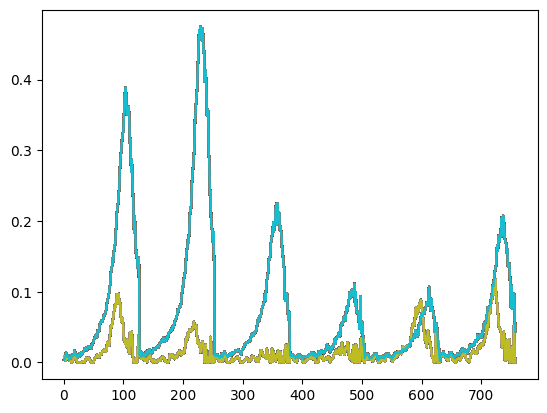

In [6]:
#check the shape of 1D spectrum dataset
print(spec_stack.shape)

wave= np.linspace(1,757,756)
for i in range(len(spec_stack)):
 for i in range(2):
  plt.plot(wave,spec_stack[i])

Computing rotational angle in degree, [-90, 90] using Principal Component Analysis (PCA)


In [7]:
import cv2
from sklearn.decomposition import PCA

def compute_orientation(image):
    """Computes the primary orientation of an image using PCA."""
    # Convert to grayscale if needed
    if len(image.shape) > 2:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Threshold the image to obtain binary mask
    _, binary = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Find nonzero pixel coordinates
    coords = np.column_stack(np.where(binary > 0))

    # Apply PCA=-
    pca = PCA(n_components=2)
    pca.fit(coords)

    # Principal axis (first component)
    eigenvector = pca.components_[0]
    angle = np.arctan2(eigenvector[1], eigenvector[0]) * 180 / np.pi

    if angle > 90:
      angle = angle - 180
    return angle

# Process each image individually
angles = np.array([compute_orientation(img) for img in im_stack])



# Save the angles=-
np.save("orientation_angles.npy", angles)
print(angles)



[-47.123453    65.48295287  45.44600579  -7.33101927  54.9744926
   4.36699723  -8.53754822 -65.37086084  33.82233268  11.04010255
  37.40692121  73.60259848  -8.87411834  69.86070173  36.65012016
  31.58334427 -25.49011662  84.86841757  32.10776213  19.25692299
 -40.15625881 -24.90185388 -56.54660576  -1.82079625 -61.1330309
  55.18372276  70.59105986  -7.11826767  58.42925451  88.38346878
  53.67897832  72.80605895  44.04739585 -61.70645927   2.03810785
  52.32540888 -64.74082324  71.67939277  35.23062386  34.60550771
  59.35419828  88.47195647  11.46979415 -66.71141445 -24.56891407
  41.45273041 -71.26446133  47.42169509  31.61632737   8.30969812
 -71.22599669 -89.07092507 -50.72717428 -84.48227409 -47.71888502
 -74.60501769  18.65690084 -44.64884819  67.21880001   4.50743353
 -65.32020801 -54.8987714   54.99518536  84.72144077 -15.27165565
  26.75726187 -48.41919837 -88.0352288   19.49614172 -81.55805035
  53.86401273  71.74778568  54.2497445   27.54255478  28.89612936
  45.6909870

Convert Datasets to Torch:

In [8]:
imgdata=im_stack
specdata=spec_stack

angledata=np.load('/content/orientation_angles.npy')


#normalize
specdata=specdata/specdata.max()
imgdata=imgdata/imgdata.max()

imgdata = torch.from_numpy(imgdata).float()
specdata = torch.from_numpy(specdata).float()

specdata = F.avg_pool1d(specdata[:, None], 6, 6).squeeze()  # reduce the spectral size via average pooling

print(imgdata.shape, specdata.shape, angledata.shape)



torch.Size([320, 80, 80]) torch.Size([320, 126]) (320,)


Take a look some of examples with angle information:

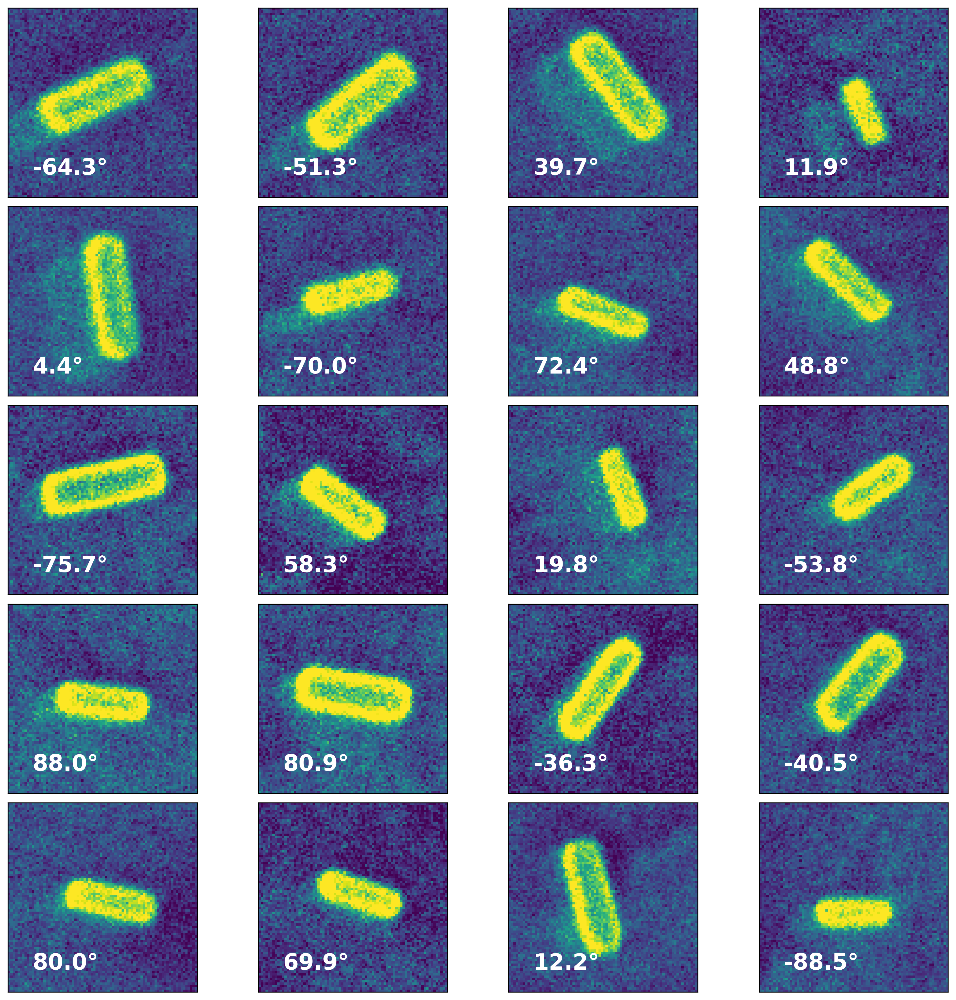

In [9]:
fig, axes = plt.subplots(5, 4, figsize=(16, 16), dpi=300,
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.05, wspace=0.05))
i = 0
for ax, im in zip(axes.flat, imgdata[230:250]):
    i += 1
    ax.imshow(im.squeeze(), cmap='viridis', interpolation='nearest')
    #ax.plot(x_coor, y_coor, color="white", linewidth=1)
    #ax.text(5, 15, str(i), color='white', fontsize=20)
    ax.text(10, 70,f"{angledata[i+229]:.1f}°", color='white', fontweight='bold', fontsize=20)


# fig.savefig('some_sem_70_106_number.png', transparent=True)

In [10]:
wave= np.linspace(0,125,126)
fig, axes = plt.subplots(5, 4, figsize=(40, 25),sharex= True, sharey= True,dpi=300,
                         subplot_kw={'yticks':[0,0.3,0.6,0.9],
                                     },
                         gridspec_kw=dict(hspace=0.1, wspace=0.1,))


xtick_labels = ["600"] + ["850/\n600"] *5 + ["850"]
xtick_positions = [0, 21, 42, 63, 84, 105, 126]  # X-axis tick positions

#[0, 17, 21, 38, 42, 59, 63, 80, 84, 101, 105, 122]

grid_positions = [0, 21, 42, 63, 84, 105, 126]

for ax in axes.flat:
    ax.set_xticks(xtick_positions)  # Set tick positions
    ax.set_xticklabels(xtick_labels, rotation=30)  # Set corresponding labels
    ax.grid(axis="x", linestyle="--", linewidth=2, alpha=0.7)  # Add dashed lines



# for axis in ['top','bottom','left','right']:
#   ax.spines[axis].set_linewidth(0.5)
ik=0

for ax, im in zip(axes.flat, specdata[230:250]):
    ax.plot(wave,im.squeeze(),lw=4)
    ax.set_ylim(0,0.65)
    ax.tick_params(axis = 'both', which = 'major', labelsize = 25, width=6 )
  #  ax.text(100, 0.5,str(ik+1),color='k',fontsize=22)
#     plt.setp(ax.spines.values(), linewidth=2)
#     if ik % 6 == 0:
#       ax.spines['left'].set_linewidth(4)
#     if ik > 29:
#       ax.spines['bottom'].set_linewidth(4)
    ik +=1


fig.text(0.5, 0.05, 'Wavelength (nm)', ha='center', size=40)
fig.text(0.08, 0.5, 'Scattering (a.u)', va='center', rotation='vertical',size=40)
# fig.savefig('some_spectra_70_106_number.png',transparent=True)



Text(0.08, 0.5, 'Scattering (a.u)')

From here on, no more emojis...

Now let's define the ImSpec base class. It consists of a 'constructor' ```__init__``` where we define our model parameters, methods for obtaining pdf-s (e.g., ```_log_normal```), computing different loss metrics (e.g. ```_compute_kld```), performing a reparametrization trick (```_reparameterize```), etc. These methods are going to be reused in all subsequent ImSpec models. Finally, there is a ```forward``` method, which defines a forward propagation of input data through our model. Here, the images will be passed through one VAE and the spectra are going to be passed through another VAE. The first VAE also enforces rotational and (optionally) translational invariance of the latent representation. At the moment, the two paths are not interacting. Note that our ```forward``` method also records all the computed losses.

In [11]:
class imspec(nn.Module):

    def __init__(self,
                 indim1: Tuple[int, int], # assumed to be images
                 indim2: Tuple[int], # assumed to be spectra
                 latent_dim: int = 3,  # for now, both VAEs will have the same number of latent dims
                 coord: int = 3, # 1 for rotation, 2 for translations, 3 for rotation+translations
                 **kwargs: torch.Tensor) -> None:
        """Initialize model parameters"""
        super(imspec, self).__init__()
        device = "cuda" if torch.cuda.is_available() else 'cpu'
        # encoder and decoder for first dataset (e.g. structural images)
        self.encoder1 = fcEncoderNet(indim1, latent_dim + coord)
        dnet = sDecoderNet if coord > 0 else fcDecoderNet
        self.decoder1 = dnet(latent_dim, indim1)
        # encoder and decoder for second dataset (e.g. spectra)
        self.encoder2 = fcEncoderNet(indim2, latent_dim)
        self.decoder2 = fcDecoderNet(latent_dim, indim2)



        # Initialize grid and get 'prior' parameters for coordinate transformations
        self.grid = generate_grid(indim1).to(device)
        self.coord = coord
        self.phi_prior = kwargs.get("phi_prior", tt(math.pi / 2)).to(device)
        self.dt_prior = kwargs.get("dt_prior", tt(0.5)).to(device)
        # Place all model parameters on the appropriate device
        self.to(device)
        self.device = device

    def _compute_kld(self,
                     z: torch.Tensor,
                     q_param: Tuple[torch.Tensor],
                     p_param: Optional[Tuple[torch.Tensor]] = None
                     ) -> torch.Tensor:
        """
        Computes KL divergence term between two normal distributions
        or (if p_param = None) between normal and standard normal distributions
        """
        qz = self._log_normal(z, *q_param)
        if p_param is None:
            pz = self._log_unit_normal(z)
        else:
            pz = self._log_normal(z, *p_param)
        return qz - pz

    @classmethod
    def _reparameterize(cls,
                        z_mu: torch.Tensor,
                        z_logsig: torch.Tensor
                        ) -> torch.Tensor:
        """Reparametrization trick"""
        batch_dim = z_mu.size(0)
        z_dim = z_mu.size(1)
        z_sig = torch.exp(z_logsig)
        eps = z_mu.new(batch_dim, z_dim).normal_()
        return z_mu + z_sig * eps

    @classmethod
    def _log_normal(cls,
                   x: torch.Tensor,
                   mu: torch.Tensor,
                   log_sig: torch.Tensor
                   ) -> torch.Tensor:
        """
        Computes log-pdf of a normal distribution
        """
        log_pdf = (-0.5 * math.log(2 * math.pi) - log_sig -
                   (x - mu)**2 / (2 * torch.exp(log_sig)**2))
        return torch.sum(log_pdf, dim=-1)

    @classmethod
    def _log_unit_normal(cls, x: torch.Tensor) -> torch.Tensor:
        """
        Computes log-pdf of a unit normal distribution
        """
        log_pdf = -0.5 * (math.log(2 * math.pi) + x ** 2)
        return torch.sum(log_pdf, dim=-1)

    @classmethod
    def _compute_re(cls,
                    x: torch.Tensor,
                    x_reconstr: torch.Tensor) -> torch.Tensor:
        """Computes binary cross-entropy reconstruction loss"""
        reconstr_loss = F.binary_cross_entropy(
            x_reconstr.flatten(1), x.flatten(1), reduction='none').sum(-1)
        return reconstr_loss

    def _transform_coordinates(self,
                               grid: torch.Tensor,
                               t_vec: torch.Tensor) -> torch.Tensor:
        """Rotation and translation of the 2d coordinate grid"""
        phi = t_vec[:, 0]
        dt = t_vec[:, 1:].unsqueeze(1) if self.coord > 1 else 0
        grid = rotate_coordinates(grid, phi)
        return grid + self.dt_prior * dt

    def forward(self, x1: torch.Tensor, x2: torch.Tensor=None) -> torch.Tensor:
        """Forward Pass"""

        self.likelihood = 0
        self.kl_divergence = 0

        # First VAE
        # Encode data
        z_mu1, z_logsig1 = self.encoder1(x1)
        # Obtain latent vector throught the 'reparametrization trick'
        z_vec1 = self._reparameterize(z_mu1, z_logsig1)
        # Split latent vector into parts associated with coordinate transformations and data content
        t_vec1 = z_vec1[:, :self.coord]
        z_vec1 = z_vec1[:, self.coord:]
        # Compute KLD for the 'conventional' latent vector
        self.kl_divergence += self._compute_kld(
            z_vec1, (z_mu1[:, self.coord:], z_logsig1[:, self.coord:]))


        # Compute KLD for the latent angle (if any)
        if self.coord in [1, 3]:
            p_loc = t_vec1.new_zeros(t_vec1.size(0), 1)
            p_scale = t_vec1.new_ones(t_vec1.size(0), 1) * self.phi_prior
            self.kl_divergence += self._compute_kld(
                t_vec1[:, :1], (z_mu1[:, :1], z_logsig1[:, :1]), (p_loc, p_scale))
            z_mu1, z_logsig1 = z_mu1[:, 1:], z_logsig1[:, 1:]
            t_vec1 = t_vec1[:, 1:] if t_vec1.size(-1) > 1 else t_vec1




        # Compute KLD for the latent shift (if any)
        if self.coord in [2, 3]:
            self.kl_divergence += self._compute_kld(
                t_vec1, (z_mu1[:, :2], z_logsig1[:, :2])) # assume unit normal prior
        # Do the affine transformation for the coordinate grid (if any)
        decoder_input = (z_vec1,)
        if self.coord:
            grid = self.grid.expand(t_vec1.shape[0], *self.grid.shape)
           # grid = self._transform_coordinates(grid, t_vec1)
            # This transform_coordinates was also not called to keep rotational information
            decoder_input = (grid,) + decoder_input
        # Pass latent data and transformed grid (if any) to decoder
        x_reconstr1 = self.decoder1(*decoder_input)
        # Compute reconstruction loss
        self.likelihood += -self._compute_re(x1, x_reconstr1)

        # Second VAE (just vanilla VAE)
        z_mu2, z_logsig2 = self.encoder2(x2)
        z_vec2 = self._reparameterize(z_mu2, z_logsig2)
        self.kl_divergence += self._compute_kld(z_vec2, (z_mu2, z_logsig2))
        x_reconstr2 = self.decoder2(z_vec2)
        self.likelihood += -self._compute_re(x2, x_reconstr2)

        return (z_vec1, x_reconstr1), (z_vec2, x_reconstr2)

## Train two VAEs with enforced similarity b/w latent spaces

Now, let's define an ```imspec``` class that learns a linear mapping (in a form of coefficients of a linear equation) between two latent spaces durign the training. The pass forward then consists of the following steps:
1. Pass $x_1$ through *encoder-1*. Get latent representation $z_1$. Computer KLD. Pass $z_1$ through *decoder-1*. Compute reconstruction loss.
2. Pass $x_2$ through *encoder-2*. Get latent representation $z_2$. Compute KLD (the latter is invariant under affine trasformation).
3. Get the $z_2' = Az_2$ transformation. Compute the $L_1(z_1, z_2')$ score.
4. Pass $z_2'$ through *decoder-2* and compute a reconstruction loss.

In [12]:
class imspec3(imspec):

    def __init__(self,
                 indim1: Tuple[int, int], # assumed to be images
                 indim2: Tuple[int], # assumed to be spectra
                 latent_dim: int = 3,  # for now, both VAEs will have the same number of latent dims
                 coord: int = 3,
                 **kwargs: torch.Tensor) -> None:
        # Initilize encoders and decoders
        args = (indim1, indim2, latent_dim, coord)
        super(imspec3, self).__init__(*args, **kwargs)
        # Define the (learnable) linear transformation coefficients
        A = torch.zeros(latent_dim, latent_dim).fill_diagonal_(1)
        A = A.to(self.device)
        self.A = nn.Parameter(A)

    @classmethod
    def _compute_l1(cls,
                    x1: torch.Tensor,
                    x2: torch.Tensor) -> torch.Tensor:
        """Computes L1 score"""
        return (x1 -x2).abs().mean()

    def linear_transform(self, z: torch.Tensor):
        """Performs a linear transformation of the latent encoding"""
        return z @ self.A

    def forward(self, x1: torch.Tensor, x2: torch.Tensor) -> torch.Tensor:
        """Forward Pass"""

        self.likelihood = 0
        self.kl_divergence = 0

        # First VAE
        # Encode data
        z_mu1, z_logsig1 = self.encoder1(x1)
        # Obtain latent vector through the 'reparametrization trick'
        z_vec1 = self._reparameterize(z_mu1, z_logsig1)
        # Split latent vector into parts associated with coordinate transformations and data content
        t_vec1 = z_vec1[:, :self.coord]
        z_vec1 = z_vec1[:, self.coord:]
        # Compute KLD for the 'conventional' latent vector
        self.kl_divergence += self._compute_kld(
            z_vec1, (z_mu1[:, self.coord:], z_logsig1[:, self.coord:]))

        # Compute KLD for the latent angle (if any)
        if self.coord in [1, 3]:
            p_loc = t_vec1.new_zeros(t_vec1.size(0), 1)
            p_scale = t_vec1.new_ones(t_vec1.size(0), 1) * self.phi_prior
            self.kl_divergence += self._compute_kld(
                t_vec1[:, :1], (z_mu1[:, :1], z_logsig1[:, :1]), (p_loc, p_scale))
            z_mu1, z_logsig1 = z_mu1[:, 1:], z_logsig1[:, 1:]
            t_vec1 = t_vec1[:, 1:] if t_vec1.size(-1) > 1 else t_vec1





        # Compute KLD for the latent shift (if any)
        if self.coord in [2, 3]:
            self.kl_divergence += self._compute_kld(
                t_vec1, (z_mu1[:, :2], z_logsig1[:, :2])) # assume unit normal prior
        # Do the affine transformation for the coordinate grid (if any)
        decoder_input = (z_vec1,)
        if self.coord:
            grid = self.grid.expand(t_vec1.shape[0], *self.grid.shape)
            #grid = self._transform_coordinates(grid, t_vec1)
           # This transform_coordinates was also not called to keep rotational information
            decoder_input = (grid,) + decoder_input
        # Pass latent data and transformed grid (if any) to decoder
        x_reconstr1 = self.decoder1(*decoder_input)
        # Compute reconstruction loss
        self.likelihood += -self._compute_re(x1, x_reconstr1)

        # Second VAE
        z_mu2, z_logsig2 = self.encoder2(x2)
        z_mu2 = self.linear_transform(z_mu2) # Do linear transformation

        z_vec2 = self._reparameterize(z_mu2, z_logsig2)
        self.kl_divergence +=  self._compute_kld(z_vec2, (z_mu2, z_logsig2))

        self.simloss = self._compute_l1(z_vec1, z_vec2)  # Compute L1 score between two latent spaces

        x_reconstr2 = self.decoder2(z_vec2)
        self.likelihood += -self._compute_re(x2, x_reconstr2)

        return (z_vec1, x_reconstr1), (z_vec2, x_reconstr2)

Initialize, model, optimizer, and dataloader:

In [13]:
print(imgdata.shape, specdata.shape)


torch.Size([320, 80, 80]) torch.Size([320, 126])


In [14]:
imgdata=im_stack[:320]
specdata=spec_stack[:320]

# imgdata=im_stack[cluster_info==1]
# specdata=spec_stack[cluster_info==1]
# cluster_shape1=cluster_shape[cluster_info==1]


#normalize
imgdata = imgdata / imgdata.max()
specdata = specdata / specdata.max()

imgdata = torch.from_numpy(imgdata).float()
specdata = torch.from_numpy(specdata).float()

specdata = F.avg_pool1d(specdata[:, None], 6, 6).squeeze()  # reduce the spectral size via average pooling

print(imgdata.shape, specdata.shape)

print("imgdata shape:", imgdata.shape, "imgdata range:", imgdata.min().item(), imgdata.max().item())
print("specdata shape:", specdata.shape, "specdata range:", specdata.min().item(), specdata.max().item())



torch.Size([320, 80, 80]) torch.Size([320, 126])
imgdata shape: torch.Size([320, 80, 80]) imgdata range: 0.0 1.0
specdata shape: torch.Size([320, 126]) specdata range: 0.0 0.9442391991615295


In [15]:
img_dim = (80, 80)
spec_dim = (126,)

# (re-)initialize dat loader
train_loader = init_dataloader(imgdata.unsqueeze(1), specdata.unsqueeze(1), batch_size=32)

# initialize model and optimizer
set_torch_seed(1)
model_shared= imspec3(img_dim, spec_dim, latent_dim=3, coord=3)
optimizer_shared = torch.optim.Adam(model_shared.parameters(), lr=1e-4)

/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Next we train our new model. Note that the main difference here is that we add a ```simloss``` term to the loss function. We also add a ```gamma``` coefficients before this new loss term which controls it's relative contribution to the total loss (similar to the idea of beta-VAE).

In [ ]:
def train_step(x1: torch.Tensor, x2: torch.Tensor,
               beta: float = 2., gamma: float = 10.) -> float:
    model_shared.train()
    _ = model_shared(x1.to(model_shared.device), x2.to(model_shared.device))
    loss = -(model_shared.likelihood - beta * model_shared.kl_divergence).mean() + gamma * model_shared.simloss
    loss.backward()
    optimizer_shared.step()
    optimizer_shared.zero_grad()
    return loss.item(), model_shared.simloss.item()

epochs = 20000

train_loss, sim = [], []
for e in range(epochs):
    train_loss_i, sim_i = 0, 0
    for (x1, x2) in train_loader:
        loss_i, sscore_i = train_step(x1, x2)
        train_loss_i += loss_i
        sim_i += sscore_i


    avg_train_loss = train_loss_i / len(train_loader)
    train_loss.append(avg_train_loss)
    sim.append(sim_i / len(train_loader))
    print("Epoch {},  Train loss {}".format(e+1, train_loss[-1]))




torch.save(model_shared.state_dict(), f"/modelcoord=3dim=2WITHKLDcomputationWITHOUTtransform_coordinates.pt")  # Saving the model
print(f"Model saved at epoch {e+1} with loss {train_loss[-1]}")



Streaming output truncated to the last 5000 lines.
Epoch 15002,  Train loss 3446.689208984375
Epoch 15003,  Train loss 3446.757421875
Epoch 15004,  Train loss 3446.6251220703125
Epoch 15005,  Train loss 3446.677880859375
Epoch 15006,  Train loss 3446.782470703125
Epoch 15007,  Train loss 3446.672412109375
Epoch 15008,  Train loss 3446.5826171875
Epoch 15009,  Train loss 3447.4242919921876
Epoch 15010,  Train loss 3446.664794921875
Epoch 15011,  Train loss 3446.841943359375
Epoch 15012,  Train loss 3446.9771728515625
Epoch 15013,  Train loss 3446.8275634765623
Epoch 15014,  Train loss 3447.0715576171874
Epoch 15015,  Train loss 3447.18076171875
Epoch 15016,  Train loss 3446.7711669921873
Epoch 15017,  Train loss 3447.3836181640627
Epoch 15018,  Train loss 3447.399267578125
Epoch 15019,  Train loss 3447.3955810546877
Epoch 15020,  Train loss 3447.0447265625
Epoch 15021,  Train loss 3447.20849609375
Epoch 15022,  Train loss 3447.557275390625
Epoch 15023,  Train loss 3446.6771728515623
Epo

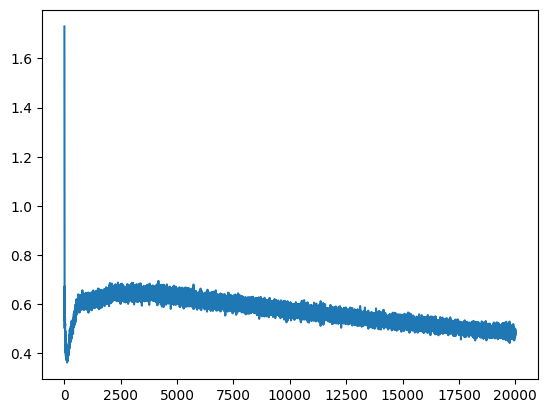

In [ ]:
plt.plot(sim)

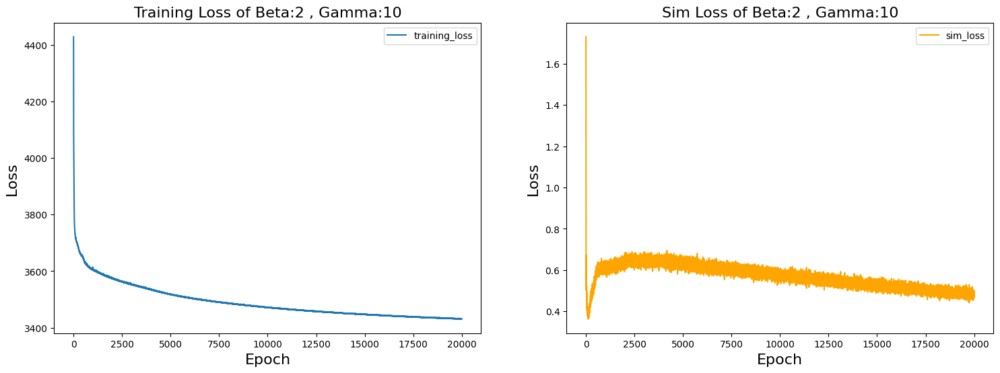

In [ ]:
fig, axes = plt.subplots(1,2, figsize =(18, 6))
a0 = axes[0].plot(train_loss, label="training_loss",)

axes[0].set_xlabel("Epoch", fontsize=16)
axes[0].set_ylabel("Loss ", fontsize=16)
axes[0].set_title('Training Loss of Beta:2 , Gamma:10', fontsize = 16)
axes[0].legend()

a1 = axes[1].plot(sim,c='orange', label="sim_loss",)

axes[1].set_xlabel("Epoch", fontsize=16)
axes[1].set_ylabel("Loss ", fontsize=16)
axes[1].set_title('Sim Loss of Beta:2 , Gamma:10', fontsize = 16)
axes[1].legend()

Encode data into the latent spaces. Note that we have an extra line that applies a learned transformation to the encoded $z$.

In [26]:
#trained model
model_file_directory='/modelcoord=1newdataset10000epochwithout_latent_angle_transformation.pt'

imgdata=im_stack
specdata=spec_stack

#normalize
imgdata = imgdata / imgdata.max()
specdata = specdata / specdata.max()

imgdata = torch.from_numpy(imgdata).float()
specdata = torch.from_numpy(specdata).float()

specdata = F.avg_pool1d(specdata[:, None], 6, 6).squeeze()  # reduce the spectral size via average pooling

print(imgdata.shape, specdata.shape)




img_dim = (80, 80)
spec_dim = (126,)
# Model class must be defined somewhere

model_shared=imspec3(img_dim, spec_dim, latent_dim=2, coord=1)

optimizer_shared= torch.optim.Adam(model_shared.parameters(), lr=1e-4)
model_shared.load_state_dict(torch.load(model_file_directory,map_location=torch.device('cpu'))) ##change cpu to gpu wgen you use it
# model.eval()
model_shared.eval()

torch.Size([320, 80, 80]) torch.Size([320, 126])


imspec3(
  (encoder1): fcEncoderNet(
    (fc_layers): Sequential(
      (0): Linear(in_features=6400, out_features=256, bias=True)
      (1): Tanh()
      (2): Linear(in_features=256, out_features=256, bias=True)
      (3): Tanh()
    )
    (fc11): Linear(in_features=256, out_features=3, bias=True)
    (fc12): Linear(in_features=256, out_features=3, bias=True)
  )
  (decoder1): sDecoderNet(
    (coord_latent): coord_latent(
      (fc_coord): Linear(in_features=2, out_features=256, bias=True)
      (fc_latent): Linear(in_features=2, out_features=256, bias=False)
      (activation): Tanh()
    )
    (fc_layers): Sequential(
      (0): Linear(in_features=256, out_features=256, bias=True)
      (1): Tanh()
      (2): Linear(in_features=256, out_features=256, bias=True)
      (3): Tanh()
    )
    (out): Linear(in_features=256, out_features=1, bias=True)
    (activation_out): Sigmoid()
  )
  (encoder2): fcEncoderNet(
    (fc_layers): Sequential(
      (0): Linear(in_features=126, out_featur

Take a look to latent space

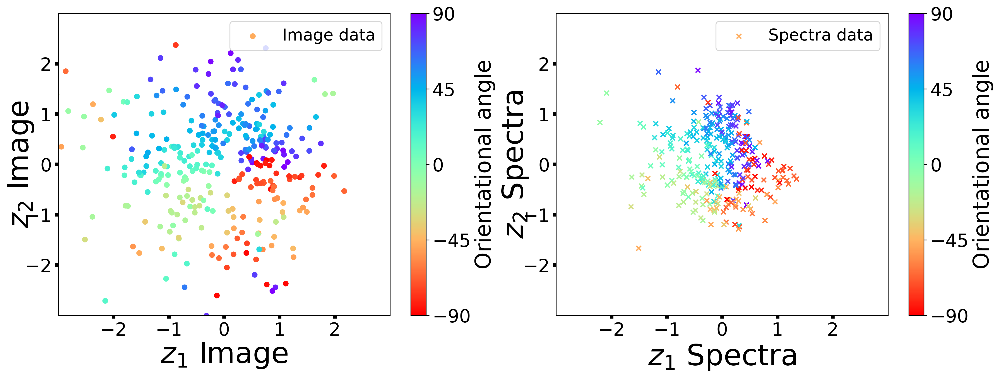

In [28]:
# initialize test dataloader (here it using the same data as the training dataloader but without random shuffling)
test_loader = init_dataloader(imgdata.unsqueeze(1), specdata.unsqueeze(1), shuffle=False)

model_shared.eval()  # switch to evaluation model (turn off batchnorm, etc.)
with torch.no_grad():  # we do not need to track gradients at the prediction stage
    z_mu1_im_sh1 = torch.cat([model_shared.encoder1(x.to(model_shared.device))[0].cpu() for (x,_) in test_loader])  # encoded image data
    z_mu2_spec_sh1 = torch.cat([model_shared.encoder2(x.to(model_shared.device))[0].cpu() for (_,x) in test_loader])  # encoded spectral data
    z_mu2_spec_sh1 = z_mu2_spec_sh1.matmul(model_shared.A.cpu())  # a.matmul(b) is equivalent to a @ b and to torch.matmul(a, b)


labels=angledata

fig, axes = plt.subplots(1,2, figsize =(18, 6),dpi=300)
a0 = axes[0].scatter(z_mu1_im_sh1[:, -1], z_mu1_im_sh1[:, -2], s=28, marker='o', label="Image data", c=labels, cmap='rainbow_r', vmin=-90, vmax=90)
 #axes[0].scatter(z_mu2_spec_un1[:, -1], z_mu2_spec_un1[:, -2], s=24, marker='x', alpha=1, label="Spectra data", c=labels,  cmap='RdYlBu', vmin=1, vmax=7)
axes[0].set_xlabel("$z_1$ Image", fontsize=32, labelpad=2)
axes[0].set_xlim([-3,3],)
axes[0].set_xticks(ticks=[-2,-1,0,1,2])
axes[0].set_ylim([-3,3],)
axes[0].set_yticks(ticks=[-2,-1,0,1,2])
axes[0].set_ylabel("$z_2$ Image", fontsize=32, labelpad=3)
axes[0].yaxis.set_label_coords(-0.07, 0.5)
axes[0].tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )

#axes[0].set_title('Image Latent Space', fontsize = 24,pad =20)
axes[0].legend(fontsize=18, loc='upper right')

 # cbar_ax1 = fig.add_axes([0.48, 0.25, 0.01, 0.5])
cbar1 = fig.colorbar(a0, ax=axes[0], ticks = [-90, -45, 0, 45, 90])
cbar1.set_label('Orientational angle',fontsize=24)
cbar1.ax.tick_params(labelsize=20)

# a1 = axes[1].scatter(z_mu1_im_un1[:, -1], z_mu1_im_un1[:, -3], s=24, marker='o', label="SEM data", c=labels,  cmap='RdYlGn', vmin=1, vmax=7)
a1=axes[1].scatter(z_mu2_spec_sh1[:, -1], z_mu2_spec_sh1[:, -2], s=28, marker='x', label="Spectra data", c=labels, cmap='rainbow_r', vmin=-90, vmax=90)
axes[1].set_xlabel("$z_1$ Spectra", fontsize=32)
axes[1].set_ylabel("$z_2$ Spectra", fontsize=32)
axes[1].set_xlim([-3,3],)
axes[1].set_xticks(ticks=[-2,-1,0,1,2])
axes[1].set_ylim([-3,3],)
axes[1].set_yticks(ticks=[-2,-1,0,1,2])
axes[1].yaxis.set_label_coords(-0.08, 0.5)
axes[1].tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )
#axes[1].set_title('Spectra Latent Space', fontsize = 24, pad =20)
axes[1].legend(fontsize=18,loc='upper right')
# cbar_ax2 = fig.add_axes([0.902, 0.25, 0.01, 0.5])
cbar2 = fig.colorbar(a1, ax=axes[1], ticks = [-90, -45, 0, 45, 90] )
cbar2.set_label('Orientational angle',fontsize=24)
cbar2.ax.tick_params(labelsize=20)
# a1.set_clim(5,7)
# cbar2.set_label('Shape of Cluster',fontsize=16,)
# cbar2.set_ticklabels(labels3)

# plt.savefig('Separated_structure_spectra_latentspace_clustersize_shared.png',transparent =True)

Only Z1 vs. Z2 for a fixed range of Z3.

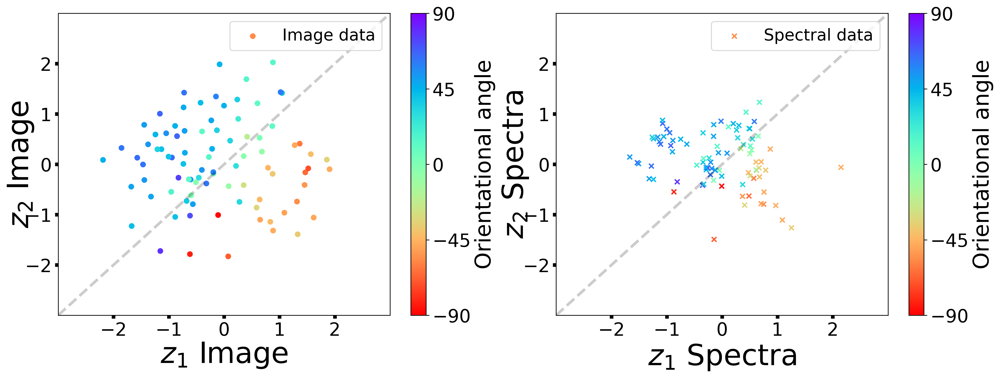

In [23]:
# Filter condition for third dimension (e.g., keep only those where z3 < -1 or z3 > 1)
mask =  (z_mu1_im_sh1[:, -3] > 0.5)

# Apply mask to image latent variables and corresponding labels
z_mu1_im_sh1_filtered = z_mu1_im_sh1[mask]
z_mu2_spec_sh1_filtered = z_mu2_spec_sh1[mask]

labels_filtered_img = labels[mask]
xy_line = np.linspace(-3, 3, 100)

fig, axes = plt.subplots(1,2, figsize =(18, 6),dpi=300)
a0 = axes[0].scatter(
    z_mu1_im_sh1_filtered[:, -1], z_mu1_im_sh1_filtered[:, -2],
    s=28, marker='o', label="Image data",
    c=labels_filtered_img, cmap='rainbow_r', vmin=-90, vmax=90
)
axes[0].set_xlabel("$z_1$ Image", fontsize=32, labelpad=2)
axes[0].set_xlim([-3,3],)
axes[0].set_xticks(ticks=[-2,-1,0,1,2])
axes[0].set_ylim([-3,3],)
axes[0].set_yticks(ticks=[-2,-1,0,1,2])
axes[0].set_ylabel("$z_2$ Image", fontsize=32, labelpad=3)
axes[0].yaxis.set_label_coords(-0.07, 0.5)
axes[0].tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )
axes[0].plot(xy_line, xy_line, color='black', linestyle='--', alpha=0.2, linewidth=3)

cbar1 = fig.colorbar(a0, ax=axes[0], ticks = [-90, -45, 0, 45, 90])
cbar1.set_label('Orientational angle',fontsize=24)
cbar1.ax.tick_params(labelsize=20)
axes[0].legend(fontsize=18, loc='upper right')

a1 = axes[1].scatter(
    z_mu2_spec_sh1_filtered[:, -1], z_mu2_spec_sh1_filtered[:, -2],
    s=28, marker='x', label="Spectral data",
    c=labels_filtered_img, cmap='rainbow_r', vmin=-90, vmax=90
)
axes[1].set_xlabel("$z_1$ Spectra", fontsize=32)
axes[1].set_ylabel("$z_2$ Spectra", fontsize=32)
axes[1].set_xlim([-3,3],)
axes[1].set_xticks(ticks=[-2,-1,0,1,2])
axes[1].set_ylim([-3,3],)
axes[1].set_yticks(ticks=[-2,-1,0,1,2])
axes[1].yaxis.set_label_coords(-0.08, 0.5)
axes[1].tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )
axes[1].plot(xy_line, xy_line, color='black', linestyle='--', alpha=0.2, linewidth=3)

cbar2 = fig.colorbar(a1, ax=axes[1], ticks = [-90, -45, 0, 45, 90] )
cbar2.set_label('Orientational angle',fontsize=24)
cbar2.ax.tick_params(labelsize=20)
axes[1].legend(fontsize=18, loc='upper right')


In [21]:
def extract_angle_input(model, image_batch):
    image_batch = image_batch.to(model.device)
    with torch.no_grad():
        z_mu1, z_logsig1 = model.encoder1(image_batch)
        z_vec1 = model._reparameterize(z_mu1, z_logsig1)
        t_vec1 = z_vec1[:, :model.coord]  # (B, coord)
        angle = t_vec1[:, 0].unsqueeze(1)  # (B, 1)
    return angle


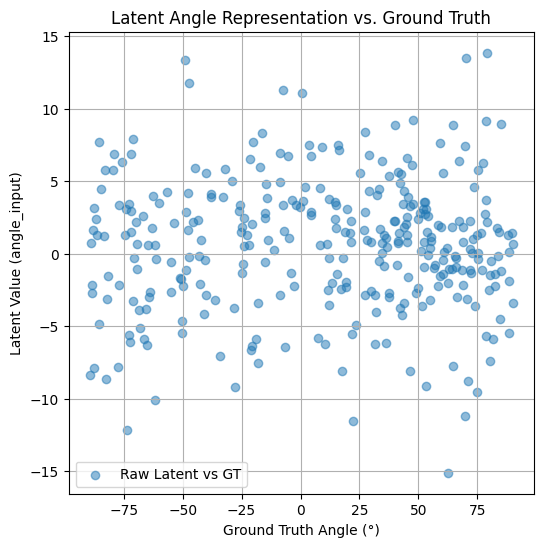

R² between latent and GT angle: 0.000


In [22]:
test_loader = init_dataloader(imgdata.unsqueeze(1), specdata.unsqueeze(1), shuffle=False)

angle_inputs = []
for (x1, _) in test_loader:
    angle = extract_angle_input(model_shared, x1)
    angle_inputs.append(angle.cpu())

angle_inputs = torch.cat(angle_inputs, dim=0)  # shape should be (320, 1)


with torch.no_grad():



    pred = angle_inputs



import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Optional: fit a simple linear regression for scaling
model = LinearRegression()
model.fit(pred.reshape(-1, 1), angledata)
pred_scaled = model.predict(pred.reshape(-1, 1))

# Plot
plt.figure(figsize=(6, 6))
plt.scatter(angledata, pred, alpha=0.5, label='Raw Latent vs GT')
plt.xlabel("Ground Truth Angle (°)")
plt.ylabel("Latent Value (angle_input)")
plt.title("Latent Angle Representation vs. Ground Truth")
plt.grid(True)
plt.legend()

# Also plot linear fit
#plt.plot(angledata, pred, color='r', linewidth=2, label="Linear Fit")
plt.legend()
plt.show()

#R² Score
r2 = r2_score(angledata, pred_scaled)
print(f"R² between latent and GT angle: {r2:.3f}")


Latent variables across VAEs, Z1 vs. Z1, Z2 vs. Z2, and Z3 vs. Z3.




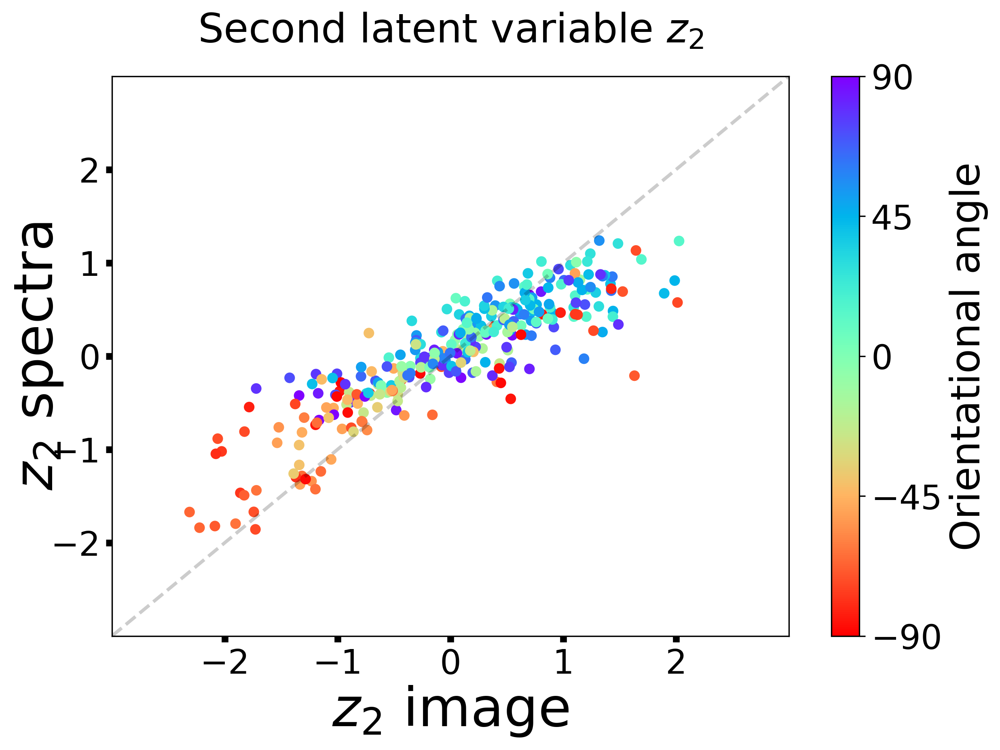

In [23]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


# Extract data
x = z_mu1_im_sh1[:, -2]
y = z_mu2_spec_sh1[:, -2]

# Fit linear regression
reg = LinearRegression().fit(x.reshape(-1, 1), y)
y_pred = reg.predict(x.reshape(-1, 1))
r2 = r2_score(y, x)  # R^2 with respect to the identity line y = x

fig, ax = plt.subplots(figsize=(9, 6), dpi=300)

# Scatterplot
sc = ax.scatter(x, y, s=28, marker='o', c=labels, cmap='rainbow_r', vmin=-90, vmax=90)

# Plot identity line (y = x)
x_line = np.linspace(-3, 3, 100)
ax.plot(x_line, x_line, color='black', linestyle='--', alpha=0.2, linewidth=2, label='$y=x$')

# Regression line (optional)
# ax.plot(x, y_pred, color='blue', linestyle='-', label='Linear fit')

# Labels and formatting
ax.set_xlabel("$z_2$ image", fontsize=32, labelpad=2)
ax.set_ylabel("$z_2$ spectra", fontsize=32, labelpad=3)
ax.set_xlim([-3, 3])
ax.set_ylim([-3, 3])
ax.set_xticks([-2, -1, 0, 1, 2])
ax.set_yticks([-2, -1, 0, 1, 2])
ax.yaxis.set_label_coords(-0.07, 0.5)
ax.tick_params(axis='both', which='major', labelsize=20, width=4)

# Title with R^2
ax.set_title(f'Second latent variable $z_2$', fontsize=24, pad=20)

#ax.text(0.95, 0.02, f'$R^2$: {r2:.3f}', transform=ax.transAxes,
 #       fontsize=20, ha='right', va='bottom')


# Colorbar
cbar = fig.colorbar(sc, ax=ax, ticks=[-90, -45, 0, 45, 90])
cbar.set_label('Orientational angle', fontsize=24)
cbar.ax.tick_params(labelsize=20)

#plt.tight_layout()
plt.show()


/tmp/ipython-input-2693113955.py:13: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(fontsize=18, loc='upper right')


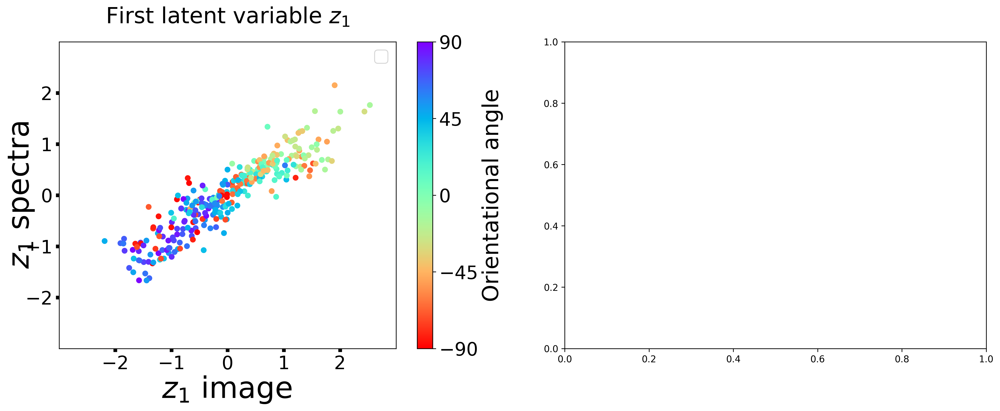

In [24]:
fig, axes = plt.subplots(1,2, figsize =(18, 6),dpi=300)
a0= axes[0].scatter(z_mu1_im_sh1[:, -1], z_mu2_spec_sh1[:, -1], s=28, marker='o',  c=labels, cmap='rainbow_r', vmin=-90, vmax=90)
axes[0].set_xlabel("$z_1$ image ", fontsize=32, labelpad=2)
axes[0].set_xlim([-3,3],)
axes[0].set_xticks(ticks=[-2,-1,0,1,2])
axes[0].set_ylim([-3,3],)
axes[0].set_yticks(ticks=[-2,-1,0,1,2])
axes[0].set_ylabel("$z_1$ spectra", fontsize=32, labelpad=3)
axes[0].yaxis.set_label_coords(-0.07, 0.5)
axes[0].tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )

axes[0].set_title('First latent variable $z_1$', fontsize = 24,pad =20)
axes[0].legend(fontsize=18, loc='upper right')
cbar1 = fig.colorbar(a0, ax=axes[0], ticks = [-90, -45, 0, 45, 90])
cbar1.set_label('Orientational angle',fontsize=24)
cbar1.ax.tick_params(labelsize=20)

#a1=axes[1].scatter(z_mu1_im_sh1[:, -2], z_mu2_spec_sh1[:, -2], s=28, marker='x',   c=labels, cmap='rainbow_r', vmin=-90, vmax=90)
#axes[1].set_xlabel("$z_2$ image", fontsize=32)
#axes[1].set_ylabel("$z_2$ spectra", fontsize=32)
#axes[1].set_xlim([-3,3],)
#axes[1].set_xticks(ticks=[-2,-1,0,1,2])
#axes[1].set_ylim([-3,3],)
#axes[1].set_yticks(ticks=[-2,-1,0,1,2])
#axes[1].yaxis.set_label_coords(-0.08, 0.5)
#axes[1].tick_params(axis = 'both', which = 'major', labelsize = 20,width=4 )
#axes[1].set_title('Second latent variable $z_2$ ', fontsize = 24, pad =20)
#axes[1].legend(fontsize=18,loc='upper right')
#cbar2 = fig.colorbar(a1, ax=axes[1], ticks = [-90, -45, 0, 45, 90] )
#cbar2.set_label('Orientational angle',fontsize=24)
#cbar2.ax.tick_params(labelsize=20)






View the learned latent manifolds. Note that we have an extra line that applies a learned transformation to the $z$ vector.

Defining a latent_grid generation function with customized latent_dim.

In [25]:
def generate_latent_grid3_slices(points_per_dim: int = 6):
    """
    Generates 3 slices of a 3D latent grid, fixing z₀ at -1, 0, +1.
    Each slice spans z₁ and z₂ over a grid of size d × d.
    """
    import numpy as np
    from itertools import product

    d = points_per_dim
    linspace = np.linspace(-1, 1, d)
    z1_z2_grid = list(product(linspace, linspace))  # (z1, z2) grid: d^2 points

    z0_vals = [-1.0, 0.0, 1.0]  # fixed z₀ slices

    z_all = []
    for z0 in z0_vals:
        slice_points = [[z0, z1, z2] for (z1, z2) in z1_z2_grid]
        z_all.extend(slice_points)

    z = torch.tensor(z_all, dtype=torch.float32)  # shape [3*d^2, 3]
    return z



In [26]:
d = 6  # or any other resolution
latent_dim = 3
z = generate_latent_grid3_slices(points_per_dim=d)  # shape: [3*d^2, 3]
z_t = torch.matmul(z, model_shared.A.cpu())

coord_grid = model_shared.grid.expand(len(z), *model_shared.grid.shape)

with torch.no_grad():
    # Decode image manifold
    manifold1_sh_im1 = model_shared.decoder1(coord_grid, z.to(model_shared.device)).cpu()

    # Decode spectrum manifold
    manifold2_sh_spec1 = model_shared.decoder2(z_t.to(model_shared.device)).cpu()



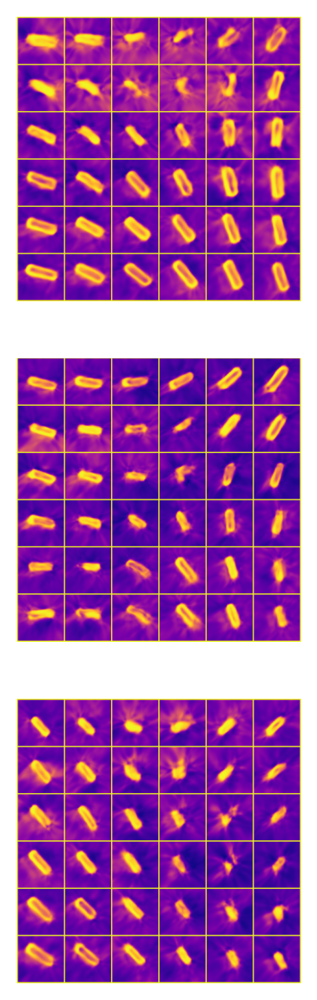

In [27]:
import matplotlib.pyplot as plt
import torchvision
import math

def visualize_3d_latent_cube(images: torch.Tensor, d: int = 6):
    """Show the 3 latent slices (fixed z₀ = −1, 0, +1) as 3 stacked grids."""
    nslices = images.shape[0] // (d * d)                # should be 3
    assert images.shape[0] == nslices * d * d, \
        f"Need nslices×d² images; got {images.shape[0]}"

    # normalise for display
    images = (images - images.min()) / (images.max() - images.min() + 1e-8)

    fig, axes = plt.subplots(nslices, 1,
                             figsize=(d * 2.2, nslices * 2.5), dpi=200)

    for i in range(nslices):
        slice_imgs = images[i * d * d : (i + 1) * d * d]      # [d², C, H, W]

        # tile slice into a d×d grid
        grid = torchvision.utils.make_grid(slice_imgs,
                                           nrow=d, padding=2, pad_value=1)

        # collapse channel dimension → 2‑D array for cmap
        grid_np = grid.mean(0).cpu().numpy() if grid.shape[0] == 3 \
                  else grid.squeeze(0).cpu().numpy()

        axes[i].imshow(grid_np, cmap='plasma')
        axes[i].axis('off')
      #  axes[i].set_title(f"Latent slice {i+1}  (fixed $z_3$:{i-1} )", fontsize=15)

    #fig.suptitle("3‑Slice View of 3‑D Latent Manifold", fontsize=18)
#    plt.tight_layout()
    plt.show()

visualize_3d_latent_cube(manifold1_sh_im1, d=d)


In [ ]:
latent_dim = 3
z, _ = generate_latent_grid2(latent_dim=latent_dim, points_per_dim=4)  # gives shape [64, 3]
z_t = torch.matmul(z, model_shared.A.cpu())  # shape [64, 3]

coord_grid = model_shared.grid.expand(len(z), *model_shared.grid.shape)  # e.g., [64, 1, 32, 32]

with torch.no_grad():
    # Pass z with coord grid to decoder1 (e.g., image manifold)
    manifold1_sh_im1 = model_shared.decoder1(coord_grid, z.to(model_shared.device)).cpu()

    # Pass z_t to decoder2 (e.g., spectrum manifold)
    manifold2_sh_spec1 = model_shared.decoder2(z_t.to(model_shared.device)).cpu()


NameError: name 'generate_latent_grid2' is not defined

In [ ]:
d = 8
z, (gridx, gridy) = generate_latent_grid(d)
z_t = torch.matmul(z, model_shared.A.cpu())
coord_grid = model_shared.grid.expand(len(z), *model_shared.grid.shape)

with torch.no_grad():
    manifold1_sh_im1 = model_shared.decoder1(coord_grid, z.to(model_shared.device)).cpu()
    manifold2_sh_spec1= model_shared.decoder2(z_t.to(model_shared.device)).cpu()

RuntimeError: mat1 and mat2 shapes cannot be multiplied (64x2 and 3x3)

([], [])

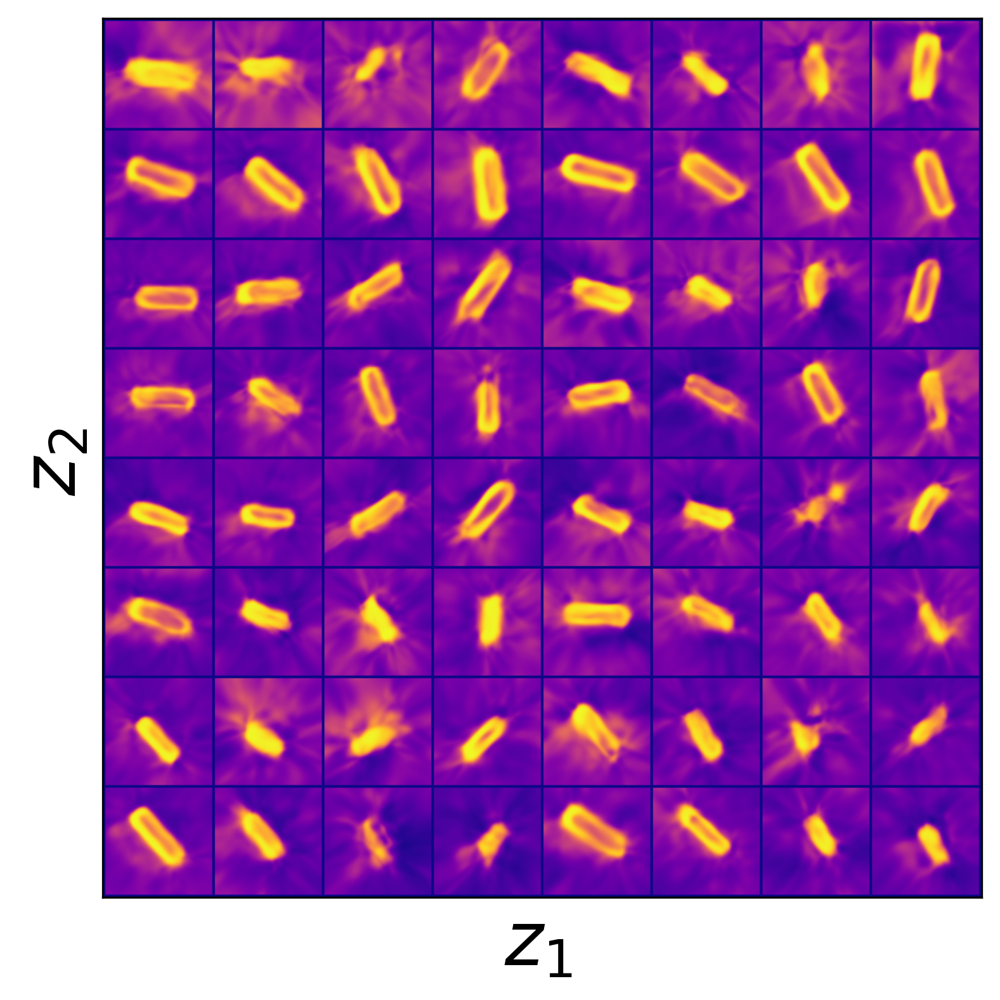

In [ ]:
d=8
grid = torchvision.utils.make_grid(manifold1_sh_im1, nrow=d, padding=2, pad_value=0)[0]
plt.figure(figsize=(6,6), dpi=300)
plt.imshow(grid, cmap='plasma')
plt.xlabel("$z_1$ ", fontsize=28)
plt.ylabel("$z_2$ ", fontsize=28)
plt.xticks([])
plt.yticks([])

# plt.savefig('Latent_space_image.jpg')

Text(0.05, 0.5, 'Intensity (a.u.)')

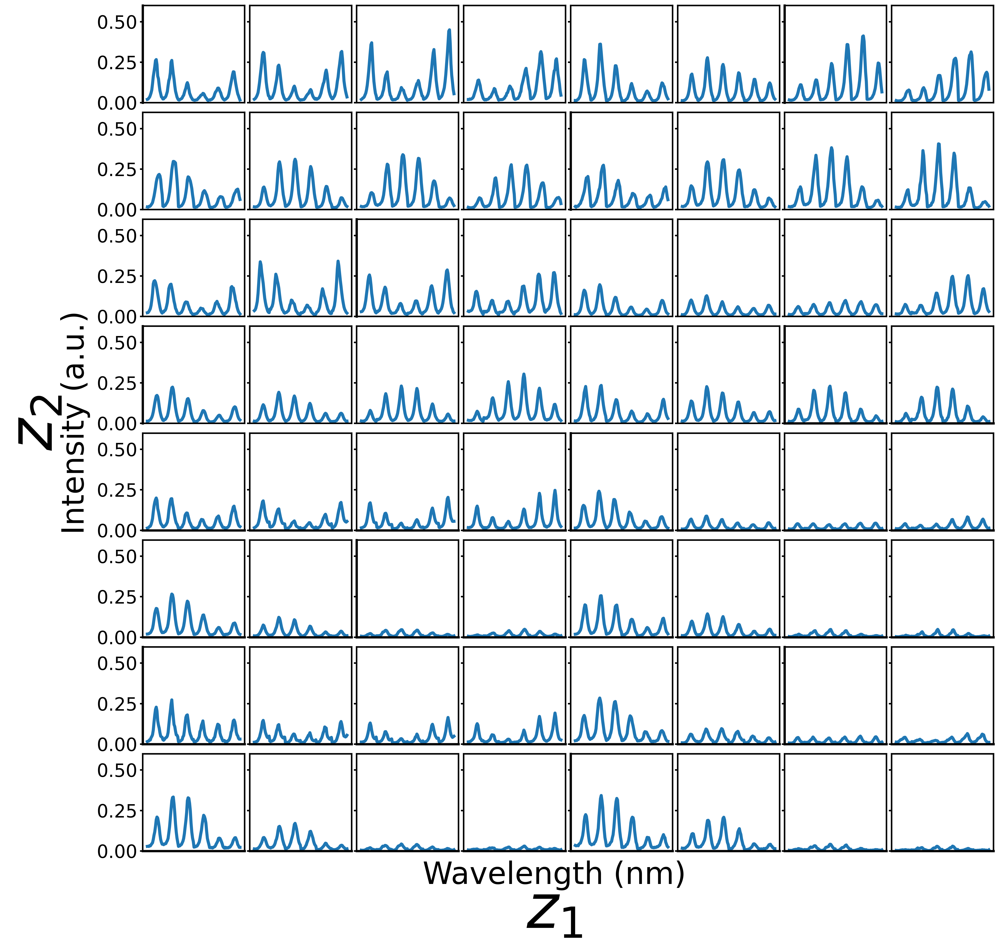

In [ ]:
wave=np.linspace(0,125,126)
fig, axes = plt.subplots(d, d, figsize=(20, 20), sharex= True, sharey= True,dpi=300,
                       subplot_kw={'xticks': [600,900],'yticks':[0,0.25,0.5] },
                       gridspec_kw=dict(hspace=0.1, wspace=0.05))





ik=0
for ax, y in zip(axes.flat, manifold2_sh_spec1):
    ax.plot(wave, y.squeeze(), lw=4)
    ax.set_ylim(0, .6)
    ax.tick_params(axis = 'both', which = 'major', labelsize =24,width=2 )
    plt.setp(ax.spines.values(), linewidth=2)
    # ax.vlines(x=20,ymin=0, ymax=0.6, linewidth=1, color='k',linestyles='--')
    if ik % 6 == 0:
      ax.spines['left'].set_linewidth(3)
    if ik > 29:
      ax.spines['bottom'].set_linewidth(3)
    ik +=1

fig.text(0.5, 0.04, '$z_1$', ha='center', size=80)
fig.text(0.0, 0.5, '$z_2$', va='center', rotation='vertical',size=80)
fig.text(0.5, 0.08, 'Wavelength (nm)', ha='center', size=40)
fig.text(0.05, 0.5, 'Intensity (a.u.)', va='center', rotation='vertical',size=40)
# fig.savefig('Latent_space_spectra.jpg')

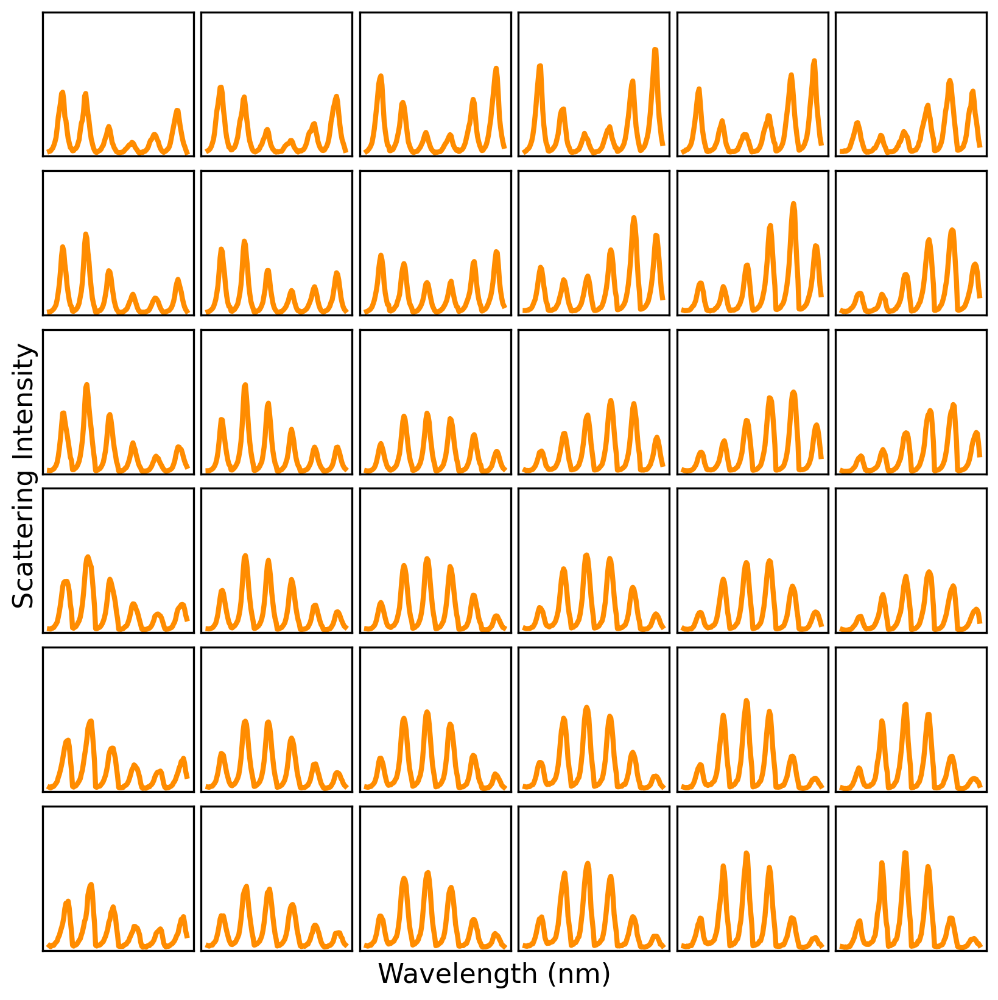

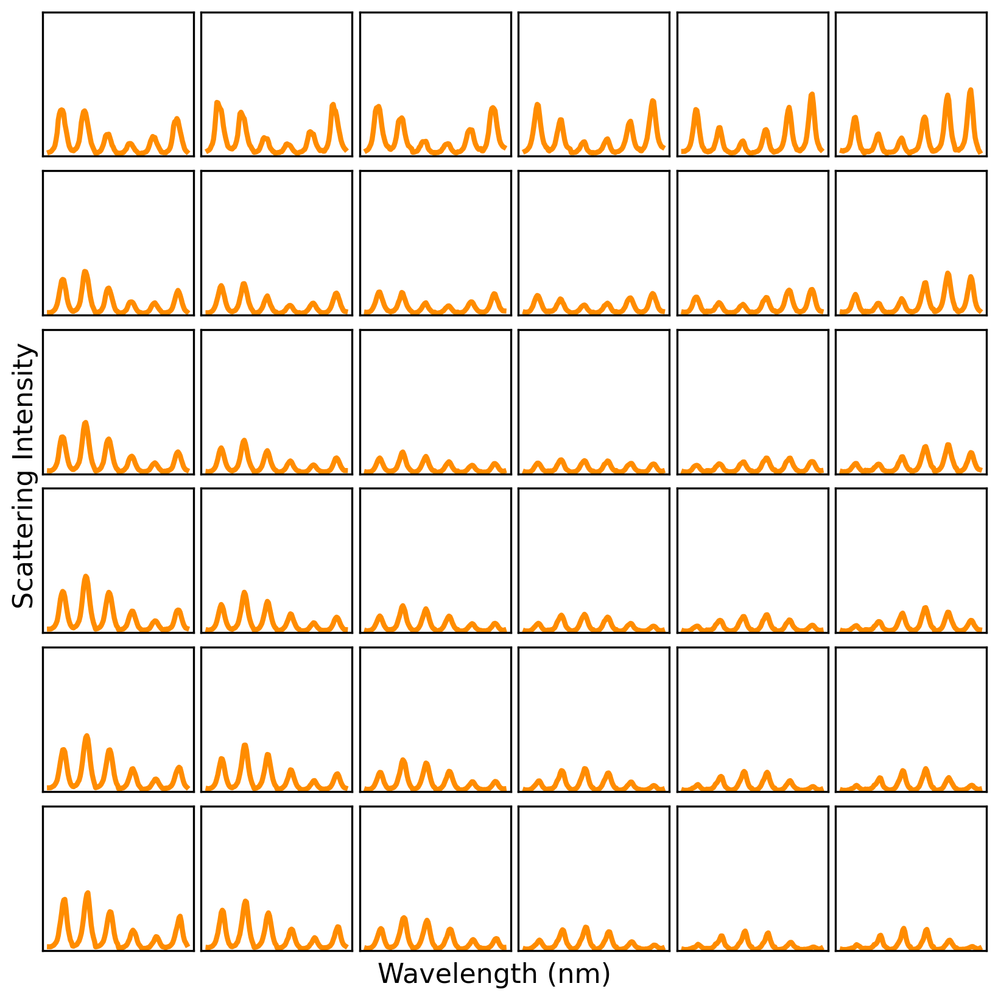

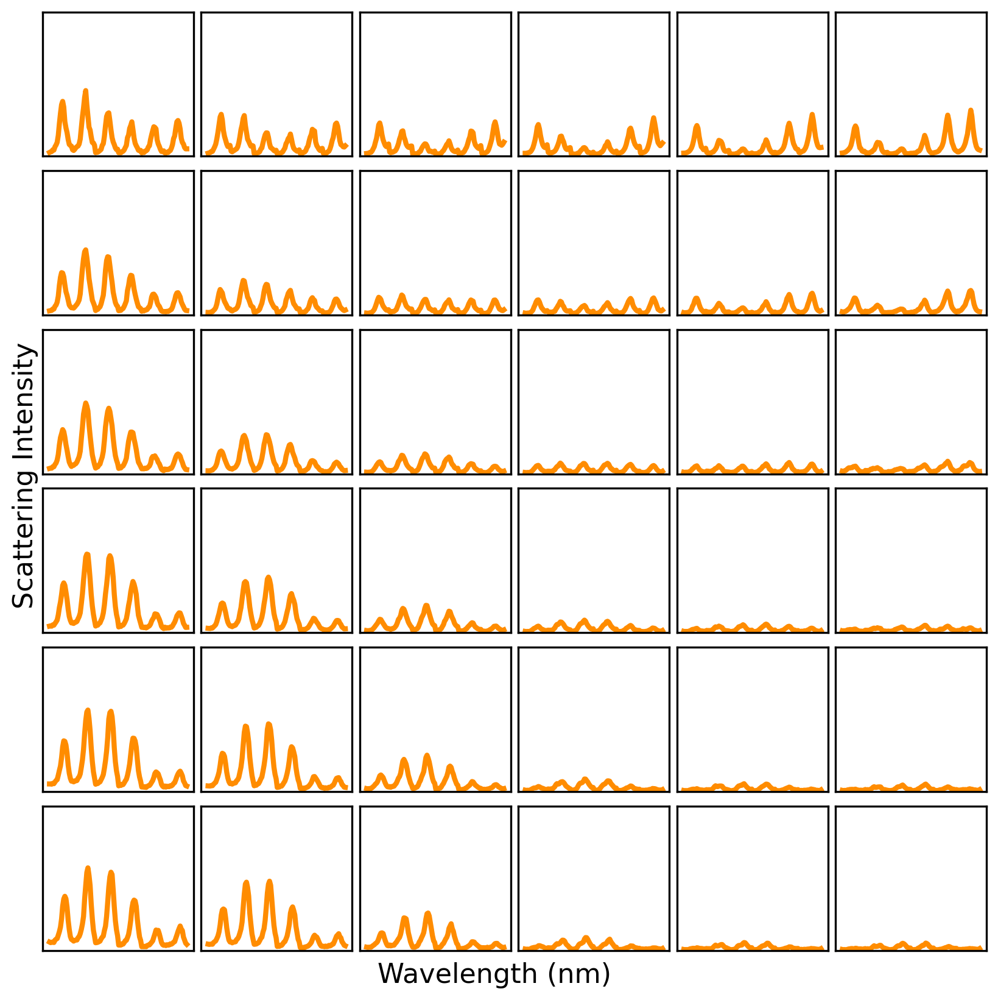

In [28]:
import matplotlib.pyplot as plt
import numpy as np

wave = np.linspace(0, 125, 126)
d = 6  # d×d grid per slice
z0_vals = [-1.0, 0.0, 1.0]  # fixed z₀ values
slices = len(z0_vals)

fig, axes_all = [], []

# Create 3 individual d×d grids
for slice_idx in range(slices):
    fig_slice, axes = plt.subplots(d, d, figsize=(10, 10),
                                    sharex=True, sharey=True,
                                    dpi=200,
                                    subplot_kw={'xticks': [], 'yticks': []},
                                    gridspec_kw=dict(hspace=0.1, wspace=0.05))
   # fig_slice.suptitle(f"Latent slice at fixed $z_3$ = {z0_vals[slice_idx]}", fontsize=20, y=0.92)
    fig_slice.text(0.1, 0.5, "Scattering Intensity", va='center', rotation='vertical', fontsize=16)
    fig_slice.text(0.4, 0.09, "Wavelength (nm)", va='center', fontsize=16)
    axes_all.append((fig_slice, axes))

# Now plot each slice
for slice_idx in range(slices):
    _, axes = axes_all[slice_idx]
    start = slice_idx * d * d
    end = (slice_idx + 1) * d * d
    spectra = manifold2_sh_spec1[start:end]

    for i in range(d):
        for j in range(d):
            idx = i * d + j
            ax = axes[i][j]
            ax.plot(wave, spectra[idx].squeeze(), lw=3, color='darkorange')
            ax.set_ylim(0, 0.6)
            ax.tick_params(axis='both', which='major', labelsize=12, width=1.2)
            plt.setp(ax.spines.values(), linewidth=1.2)

    # Add axis labels to just the first subplot
    # axes[-1][d//2].set_xlabel("Wavelength (nm)", fontsize=14)




# Show all figures
plt.tight_layout
plt.show()



Let's also define a function that takes images (spectra) as an input at outputs spectra (images) and try it on the image -> spectrum predictions.

In [29]:
def hybrid_fwd(model: Type[torch.nn.Module], x: torch.Tensor,
               out: str) -> torch.Tensor:
    """
    Passes the input features through the encoder of the first (second) model to obtain
    a latent code which is then passed through the decoder of the second (first) model
    """
    if out not in ['image', 'spectrum']:
        raise NotImplementedError("argument 'out' must be 'image' or 'spectrum'")
    x = x.to(model.device)
    model.eval()
    with torch.no_grad():
        z_mu = model.encoder2(x)[0] @ model.A if out == 'image' else model.encoder1(x)[0]
        z_mu = z_mu[:, model.coord:] if out == 'spectrum' else z_mu

        dec1_input = (z_mu,)
        if model.coord > 0:
            grid = model.grid.expand(z_mu.size(0), *model.grid.size())
            dec1_input = (grid,) + dec1_input
        x_rec = model.decoder1(*dec1_input) if out == 'image' else model.decoder2(z_mu)
    return x_rec.cpu()



Predicting image using spectra as input from the testing (ground truth) dataset that aren't included in the training:

First, loading and normalizing the dataset.



In [30]:
groundtruth_image = np.load('/content/drive/MyDrive/With Zixu - VAE predicting NRs/Grouth truth image.npy')
groundtruth_spec = np.load('/content/drive/MyDrive/With Zixu - VAE predicting NRs/Ground truth spectral.npy')


gt_angles = np.array([compute_orientation(img) for img in groundtruth_image])  #Compute and save the orientation angles for groundtruth images

np.save("GT orientation_angles.npy", gt_angles)
print(gt_angles)


groundtruth_image = groundtruth_image/groundtruth_image.max()
groundtruth_spec = groundtruth_spec/groundtruth_spec.max()

groundtruth_image = torch.from_numpy(groundtruth_image).float()
groundtruth_spec = torch.from_numpy(groundtruth_spec).float()

groundtruth_spec = F.avg_pool1d(groundtruth_spec[:, None], 6, 6).squeeze()

print("img shape:", groundtruth_image.shape, "img range:", groundtruth_image.min().item(), groundtruth_image.max().item())
print("spec shape:", groundtruth_spec.shape, "spec range:", groundtruth_spec.min().item(), groundtruth_spec.max().item())  # This stack consists of 40 NRs

[-17.98380174 -67.64302608 -80.47684579  14.99034511  -0.98731708
 -34.04564539  -2.35927371 -67.1996624  -21.50206508   4.74733739
  83.14051848 -73.69818447 -16.79692996 -40.59601044 -56.86545609
  -4.98362891  85.36930169 -86.20586776  73.80785979  73.40730082
  71.34442431 -62.35173783  55.89290385 -22.36811727 -66.90933957
  87.33513371  26.67103706 -28.4533941   79.80162093  37.40016184
 -10.25405763  54.234618   -78.39835241 -84.15213778 -87.69663973
  32.05176195  42.39411013  44.5437044   74.94657545  68.9459564 ]
img shape: torch.Size([40, 80, 80]) img range: 0.0 1.0
spec shape: torch.Size([40, 126]) spec range: 0.0 0.9692716598510742


/tmp/ipython-input-107970844.py:31: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[1].legend()


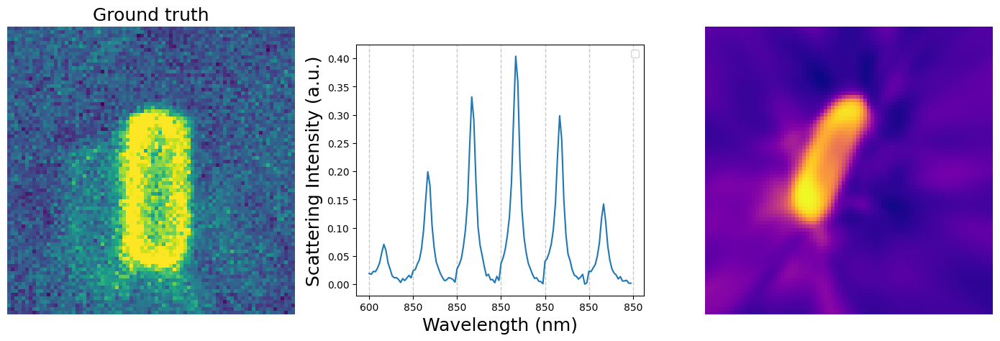

In [35]:
k = 6 # image/spectra index


wave=np.linspace(0,125,126)



fig, axes = plt.subplots(1,3 , figsize=(14,12), )

#Image as a input
x_input = groundtruth_image[k]
x_input_im = x_input[None, None] # add two pseudo-dimensions for batch size and channel
x_pred_spec = hybrid_fwd(model_shared, x_input_im, out='spectrum')

axes[0].imshow(groundtruth_image[k].squeeze())
axes[0].set_title('Ground truth', size=18)
axes[0].axis('off')
#axes[0].text(10, 70,f"{gt_angles[k]:.1f}°", color='white', fontweight='bold', fontsize=20)

# axes[0,1].plot(wave,x_pred_spec.squeeze(), c='tab:red',label='Predicted Spectrum', )
# axes[0,1].plot(wave,specdata[k],'tab:blue', label='Ground Truth Spectrum')
# a0.set_clim(0,0.00003)
# axes[0,1].legend()
# axes[0,1].set_xlabel('Wavelength (nm)', fontsize=18)
# axes[0,1].set_ylabel('Intensity (a.u.)', fontsize=18)
# axes[0,1].set_title('Model Prediction', size=18)


axes[1].plot(wave, groundtruth_spec[k],c='tab:blue')
#axes[1].plot(wave, x_pred_spec.squeeze(),c='tab:orange', label='Prediction')
axes[1].legend()
#axes[1].set_title('Spectra as input', size=18)
axes[1].set_xlabel('Wavelength (nm)', fontsize=18)
axes[1].set_ylabel('Scattering Intensity (a.u.)', fontsize=18)

axes[1].set_aspect(270)

xtick_labels = ["600"] + ["850"] * 6  # First tick is 600, rest are 850
xtick_positions = [0, 21, 42, 63, 84, 105, 126]  # X-axis tick positions
for ax in axes.flat:
    axes[1].set_xticks(xtick_positions)  # Set tick positions
    axes[1].set_xticklabels(xtick_labels)  # Set corresponding labels
    axes[1].grid(axis="x", linestyle="--", linewidth=1, alpha=0.7)  # Add dashed lines



#spectra as a input
x_input = groundtruth_spec[k]
x_input_spec = x_input[None, None] # add two pseudo-dimensions for batch size and channel
x_pred_im= hybrid_fwd(model_shared, x_input_spec, out='image')

# axes[1,0].plot(x_pred.squeeze(), c='tab:red',label='Predict', )

# a0.set_clim(0,0.00003)






axes[2].imshow(x_pred_im.squeeze(),cmap='plasma')
#axes[2].set_title('Prediction', size=18)
axes[2].axis('off')


plt.tight_layout()


#print("Learned Rotation Angle:", predicted_angles[0])

plt.show()




Predicting image using spectra as input from the training dataset:

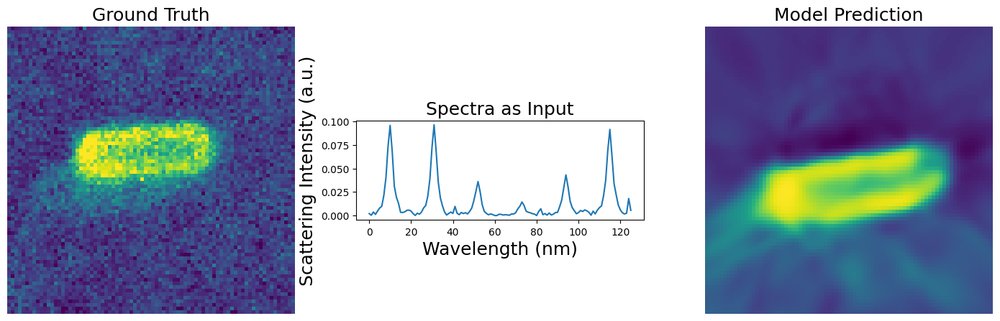

In [ ]:
k = 75 # input image/spectra index


wave=np.linspace(0,125,126)



fig, axes = plt.subplots(1,3 , figsize=(14,12), )

#Image as a input
#x_input = imgdata[k]
#x_input_im = x_input[None, None] # add two pseudo-dimensions for batch size and channel
#x_pred_spec = hybrid_fwd(model_shared, x_input_im, out='spectrum')

axes[0].imshow(imgdata[k].squeeze())
axes[0].set_title('Ground Truth', size=18)
axes[0].axis('off')
#axes[0].text(10, 70,f"{angledata[k]:.1f}°", color='white', fontweight='bold', fontsize=20)


#axes[0,1].plot(wave,x_pred_spec.squeeze(), c='tab:red',label='Predicted Spectrum', )
#axes[0,1].plot(wave,specdata[k],'tab:blue', label='Ground Truth Spectrum')
# a0.set_clim(0,0.00003)
#axes[0,1].legend()
#axes[0,1].set_xlabel('Wavelength (nm)', fontsize=18)
#axes[0,1].set_ylabel('Intensity (a.u.)', fontsize=18)
#axes[0,1].set_title('Model Prediction', size=18)

#spectra as a input
x_input = specdata[k]
x_input_spec = x_input[None, None] # add two pseudo-dimensions for batch size and channel
x_pred_im= hybrid_fwd(model_shared, x_input_spec, out='image')

# axes[1,0].plot(x_pred.squeeze(), c='tab:red',label='Predict', )
axes[1].plot(specdata[k],c='tab:blue')
axes[1].set_title('Spectra as Input', size=18)
axes[1].set_xlabel('Wavelength (nm)', fontsize=18)
axes[1].set_ylabel('Scattering Intensity (a.u.)', fontsize=18)

axes[1].set_aspect(450)


axes[2].imshow(x_pred_im.squeeze())
axes[2].set_title("Model Prediction", size=18)
axes[2].axis('off')





plt.tight_layout()
plt.show()




In [32]:
import matplotlib.pyplot as plt
print(plt.colormaps())


['magma', 'inferno', 'plasma', 'viridis', 'cividis', 'twilight', 'twilight_shifted', 'turbo', 'berlin', 'managua', 'vanimo', 'Blues', 'BrBG', 'BuGn', 'BuPu', 'CMRmap', 'GnBu', 'Greens', 'Greys', 'OrRd', 'Oranges', 'PRGn', 'PiYG', 'PuBu', 'PuBuGn', 'PuOr', 'PuRd', 'Purples', 'RdBu', 'RdGy', 'RdPu', 'RdYlBu', 'RdYlGn', 'Reds', 'Spectral', 'Wistia', 'YlGn', 'YlGnBu', 'YlOrBr', 'YlOrRd', 'afmhot', 'autumn', 'binary', 'bone', 'brg', 'bwr', 'cool', 'coolwarm', 'copper', 'cubehelix', 'flag', 'gist_earth', 'gist_gray', 'gist_heat', 'gist_ncar', 'gist_rainbow', 'gist_stern', 'gist_yarg', 'gnuplot', 'gnuplot2', 'gray', 'hot', 'hsv', 'jet', 'nipy_spectral', 'ocean', 'pink', 'prism', 'rainbow', 'seismic', 'spring', 'summer', 'terrain', 'winter', 'Accent', 'Dark2', 'Paired', 'Pastel1', 'Pastel2', 'Set1', 'Set2', 'Set3', 'tab10', 'tab20', 'tab20b', 'tab20c', 'grey', 'gist_grey', 'gist_yerg', 'Grays', 'magma_r', 'inferno_r', 'plasma_r', 'viridis_r', 'cividis_r', 'twilight_r', 'twilight_shifted_r', 't

Here let's visualize all 40 predicted (or ground truth) images with angles.

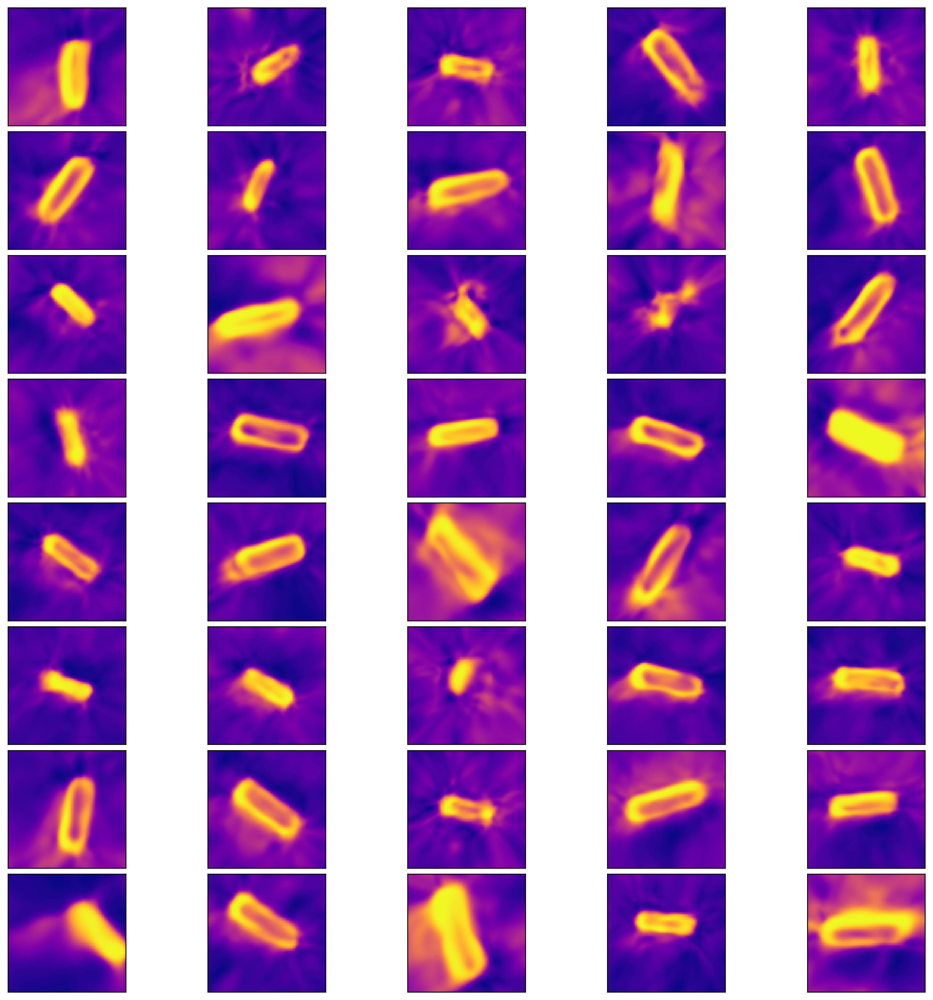

In [33]:
fig, axes = plt.subplots(8, 5, figsize=(16, 16), dpi=300,
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.05, wspace=0.05))


x_input = groundtruth_spec[:40]
x_input_spec = x_input[:, None, None]
x_pred_im= hybrid_fwd(model_shared, x_input_spec, out='image')

for i, (ax, im) in enumerate(zip(axes.flat, x_pred_im)):  # switching between groundtruth_image and x_pred_im


    if im.ndim == 3:
      im = im.squeeze(0)

    ax.imshow(im, cmap='plasma', interpolation='nearest')

    #ax.plot(x_coor, y_coor, color="white", linewidth=1)
    #ax.text(5, 15, str(i), color='black',fontweight='bold', fontsize=15)
   # ax.text(10, 70,f"{gt_angles[i]:.1f}°", color='white', fontweight='bold', fontsize=20)

plt.show()


Here's to select a few ground truth and prediction images for comparison.

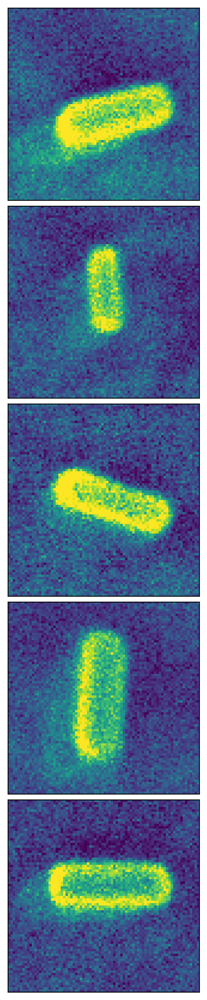

In [ ]:
fig, axes = plt.subplots(5, 1, figsize=(16, 16), dpi=300,
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.03, wspace=0.03))

fig.subplots_adjust(left=0.05, right=0.95, wspace=0.02, hspace=0.02)

selected_indices = [7,4,18,30,34]
x_input = groundtruth_spec[selected_indices]
x_input_spec = x_input[:, None, None]
x_pred_im= hybrid_fwd(model_shared, x_input_spec, out='image')



for i, (ax, im) in enumerate(zip(axes.flat, groundtruth_image[selected_indices])):  # switching between groundtruth_image[selected_indices] and x_pred_im


    if im.ndim == 3:
      im = im.squeeze(0)

    ax.imshow(im, cmap='viridis', interpolation='nearest') # 'plasma'or 'viridis'

    #ax.plot(x_coor, y_coor, color="white", linewidth=1)
    #ax.text(5, 15, str(i), color='black',fontweight='bold', fontsize=15)
   # ax.text(10, 70,f"{gt_angles[i]:.1f}°", color='white', fontweight='bold', fontsize=20)

plt.show()